In [80]:
import numpy as np
from scipy.linalg import sqrtm, inv
import matplotlib.pyplot as plt
from scipy.linalg import eig
from cycler import cycler
import pandas as pd
from scipy.optimize import curve_fit
import math
import seaborn as sns

plt.rcParams['axes.prop_cycle'] = cycler(color=plt.cm.tab20.colors)

level = [1,2,3,5,7,10,20,30,50,70,100,125,150, 175, 200, 225, 250, 300, 350, 400, 450,  500, 550,600, 650, 700, 750, 775, 800, 825, 850, 875, 900, 925, 950, 975, 1000]
def dgbd_model(r, A, a, b, P):
    return A * (P + 1 - r) ** b / r ** a

# 拟合，不包括P参数，P为常数
def dgbd_model_noP(r, A, a, b):
    P = r.max()
    return dgbd_model(r, A, a, b, P)

def dgbd_fit(x, y, p0=[1, 1, 1], title='dgbd'):
    popt, pcov = curve_fit(dgbd_model_noP, x, y, p0=p0)

    print("拟合参数A, a, b:", popt)

    # 拟合曲线
    t_fit = dgbd_model_noP(x, *popt)

    plt.scatter(x, y, label='Data')
    plt.plot(x, t_fit, color='red', label='DGBD Fit')
    plt.xlabel('index')
    plt.ylabel('non-negative log value')
    plt.title(title)
    plt.legend()
    plt.show()
    
    return popt

def get_positive_contributions(jac_arr):    
    ave_sig = []
    for i in range(1, jac_arr.shape[1]+1)[::-1]:
        ave_sig.append(np.mean(jac_arr[0][0:i]))

    output = []
    for id in range(len(ave_sig)-1):
        diff = ave_sig[id+1] - ave_sig[id]
        output.append(diff)
    return output

def compute_entropy(increments):
    if not increments:
        return 0.0
    
    total = sum(increments)
    # If total is 0, there's no variation => 0.0 entropy
    if total == 0:
        return 0.0
    
    # Normalize to probabilities
    probabilities = [x / total for x in increments]

    # Compute Shannon entropy (base 2)
    entropy = 0.0
    for p in probabilities:
        # Only compute for p > 0 to avoid math domain errors
        if p > 0:
            entropy -= p * math.log2(p)

    return entropy

def gini(jac_mean):
    return np.cumsum(jac_mean)[-1] / len(jac_mean) - 0.5

def svd_jacs(test_id_first, start, end, interval, seed, eps):
    jacs = {i:[] for i in range(start, end, interval)}
    us = {i:[] for i in range(start, end, interval)}
    vts = {i:[] for i in range(start, end, interval)}
    mats = {i:[] for i in range(start, end, interval)}
    Sigs = {i:[] for i in range(start, end, interval)}
    for k in range(seed):
        test_id = test_id_first + str(k)
        for i in range(start, end, interval):
            str_i = f'{i:04d}'
            mat = np.load(f'../results/jacobian/{test_id}/jac_{str_i}.npy')
            L = np.load(f'../results/cov_L/{test_id}/L_{str_i}.npy')
                
            u, s, vt = cal_W(mat, L, eps)
            jacs[i].append(s)
            us[i].append(u)
            vts[i].append(vt)
            mats[i].append(mat)
            Sigs[i].append(L)

    return jacs, us, vts, mats, Sigs

def plot_singular_cum(test_id_first, eps = 'all', seed = 0, window=5, window2='all', start=1, end=16435, interval=108, seq_len=30, log_bool=False):
    start_date = pd.to_datetime("1979/01/01", format="%Y/%m/%d")
    singular, us, vts, mats, Sigs = svd_jacs(test_id_first, start, end, interval, seed, eps)
    gn_dic = {}
    gn_dic_std = {}
    # entropy_dic = {}
    fig1, ax1 = plt.subplots(figsize=(4, 3), dpi=100)
    fig2, ax2 = plt.subplots(figsize=(4, 3), dpi=100)

    for i in range(start, end, interval):
        gn_ls = []
        for k in range(seed):
            jac_arr = np.array(singular[i][k])
            # countri_list = get_positive_contributions(jac_arr)
            # entropy = compute_entropy(countri_list)
            if log_bool:
                jac_arr = np.log(jac_arr)
            jac_mean = jac_arr #np.mean(jac_arr, axis=0)
            jac_mean_cum = np.cumsum(jac_mean)
            jac_mean_cum /= jac_mean_cum[-1]
            gn = gini(jac_mean_cum)
            gn_ls.append(gn)
        
        time_start = start_date + pd.Timedelta(days=i+seq_len)
        time_end = time_start + pd.Timedelta(days=interval)
        time_str = time_start.strftime("%Y-%m-%d") + '--' + time_end.strftime("%Y-%m-%d")
        gn_dic[time_str] = np.mean(gn_ls)
        gn_dic_std[time_str] = np.std(gn_ls)
        # entropy_dic[time_str] = entropy
        ax1.plot(jac_mean[:window], 
                label=time_str, 
                alpha=0.5)
        # plt.fill_between(range(window), jac_mean[:window]+jac_std[:window], jac_mean[:window]-jac_std[:window], alpha=0.15)

        if window2 == 'all':
            ax2.plot(jac_mean_cum, label=time_str, alpha=0.5)
        else:
            ax2.plot(jac_mean_cum[:window2], label=time_str, alpha=0.5)
    ax2.set_xlabel("singular value index")
    #plt.xticks(range(window), [1+i for i in range(window)])
    ax2.set_ylabel("singular cumsum(normalized)")
    # plt.ylim([0.4,1])
    # plt.xlim([0,50])
    ax2.legend(loc=[1.01,0])

    ax1.set_xlabel("singular value index")
    ax1.set_xticks(range(window), [1+i for i in range(window)])
    ax1.set_ylabel("singular value")
    ax1.legend(loc=[1.01,0])
 
    return gn_dic, gn_dic_std, singular, us, vts, mats, Sigs

def analysis_u(us, seq_len, dims, start, end, interval, target):
    start_date = pd.to_datetime("1979/01/01", format="%Y/%m/%d")
    for j in target:
        for i in range(start, end, interval):
            time_start = start_date + pd.Timedelta(days=i+seq_len)
            time_end = time_start + pd.Timedelta(days=interval)
            time_str = time_start.strftime("%Y-%m-%d") + '--' + time_end.strftime("%Y-%m-%d")
            u = np.array(us[i])
            u_col1 = u[0, :, j]
            u_col1 = u_col1.reshape(seq_len,dims)
            u_col1 = np.abs(u_col1)
            n_ticks = u_col1.shape[1]
            x_ticks = u_col1.shape[0]
            plt.figure(dpi=150)
            sns.heatmap(u_col1.T)
            plt.ylabel('level(hpa)')
            plt.xlabel('time(day)')
            plt.xticks(ticks=np.arange(x_ticks) + 0.5)
            plt.yticks(ticks=np.arange(n_ticks) + 0.5, labels=level[:n_ticks],rotation=0,fontsize=6)
            plt.title(time_str+"_index={0}".format(j))
            
def create_block_diagonal_matrix(matrix1, matrix2):
    if matrix1.ndim != 2 or matrix2.ndim != 2:
        raise ValueError("The input matrix must be two-dimensional.")
    if matrix1.shape[0] != matrix1.shape[1] or matrix2.shape[0] != matrix2.shape[1]:
        raise ValueError("The input matrix must be a square matrix.")
    n1 = matrix1.shape[0]
    n2 = matrix2.shape[0]
    result_dim = n1 + n2
    result = np.zeros((result_dim, result_dim), dtype=matrix1.dtype)
    result[:n1, :n1] = matrix1
    result[n1:, n1:] = matrix2
    return result

def cal_W(A, Sigma, eps):
    n = A.shape[0]
    matrix_a = np.conj(A).T @ np.linalg.inv(Sigma) @ A
    matrix_b = np.linalg.inv(Sigma)
    block_matrix = create_block_diagonal_matrix(matrix_a, matrix_b)
    U, S, VT = np.linalg.svd(block_matrix)
    if eps == "all":
        U = np.abs(U)
    else:
        m = np.sum(S > float(eps)) 
        if m==0:
            m=1
        U = np.abs(U)[:, :m]
        S = S[:m]
    U2 = U[:n,:] + U[n:,:]
    U2 = U2 @ np.diag(S)
    U2U, S2, V2T = np.linalg.svd(U2)
    if eps != "all":
        m = np.sum(S2 > float(eps)) 
        if m==0:
            m=1
        U2U = U2U[:, :m]
        V2T = V2T[:, :m]
        S2 = S2[:m]
    return U2U, S2, V2T

def extract_rows_with_interval(matrix, start_row_index, interval=37):
    if not isinstance(matrix, np.ndarray):
        try:
            matrix = np.array(matrix)
        except Exception as e:
            print(f"错误：无法将输入转换为NumPy数组: {e}")
            return np.array([]) # 返回一个空数组

    # 检查矩阵是否至少是二维的
    if matrix.ndim < 2:
        print("错误：输入矩阵的维度必须至少为2。")
        return np.array([])

    num_rows = matrix.shape[0]

    # 检查起始行索引是否有效
    if start_row_index < 0 or start_row_index >= num_rows:
        print(f"错误：起始行索引 {start_row_index} 超出了矩阵的有效行范围 [0, {num_rows - 1}]。")
        return np.array([]) # 返回一个空数组

    # 生成要提取的行的索引列表
    # range(start, stop, step)
    row_indices_to_extract = list(range(start_row_index, num_rows, interval))
    print(row_indices_to_extract)

    if not row_indices_to_extract:
        print("根据给定的起始行和间隔，没有行可以被提取。")
        return np.array([])

    # 使用高级索引直接从原矩阵中提取这些行
    extracted_matrix = matrix[row_indices_to_extract, :] # ':' 表示提取所有列

    return extracted_matrix

def extract_cols_with_interval(matrix, start_col_index, interval=37):
    if not isinstance(matrix, np.ndarray):
        try:
            matrix = np.array(matrix)
        except Exception as e:
            print(f"错误：无法将输入转换为NumPy数组: {e}")
            return np.array([]) # 返回一个空数组

    # 检查矩阵是否至少是二维的
    if matrix.ndim < 2:
        print("错误：输入矩阵的维度必须至少为2。")
        return np.array([])

    num_cols = matrix.shape[1] # 获取总列数

    # 检查起始列索引是否有效
    if start_col_index < 0 or start_col_index >= num_cols:
        print(f"错误：起始列索引 {start_col_index} 超出了矩阵的有效列范围 [0, {num_cols - 1}]。")
        return np.array([]) # 返回一个空数组

    # 生成要提取的列的索引列表
    # range(start, stop, step)
    col_indices_to_extract = list(range(start_col_index, num_cols, interval))

    if not col_indices_to_extract:
        print("根据给定的起始列和间隔，没有列可以被提取。")
        return np.array([])

    # 使用高级索引直接从原矩阵中提取这些列
    # ':' 表示提取所有行
    extracted_matrix = matrix[:, col_indices_to_extract]

    return extracted_matrix

def plot_ce_index(val_dic, val_std, y_lab = "gini"):
    x_labels0 = list(val_dic.keys())
    x_labels = [i[:10] for i in x_labels0]
    y_val = np.array(list(val_dic.values()))
    y_val_std = np.array(list(val_std.values()))
    tick_positions = np.arange(len(x_labels))
    marker_x_positions = tick_positions + 0.5

    plt.figure(figsize=(8, 4))
    plt.plot(marker_x_positions, y_val, marker='o', linestyle='-')
    plt.fill_between(marker_x_positions, y_val+y_val_std, y_val-y_val_std, alpha=0.15)
    plt.ylabel(y_lab)
    plt.xticks(ticks=tick_positions, labels=x_labels, rotation=45, ha='right')
    if len(marker_x_positions) > 0:
        plt.xlim(tick_positions[0] - 0.5, tick_positions[-1] + 0.5 + 0.5)
    plt.tight_layout()
    plt.show()
    
def log_max_abs_eig(matrix_dic):
    """
    Compute the natural log of the absolute largest eigenvalue for each matrix
    
    Returns:
    list: Natural logs of the absolute largest eigenvalues
    """
    results = []
    x_labels = list(matrix_dic.keys())
    matrix_list = list(matrix_dic.values())
    for idx, matrix in enumerate(matrix_list):
        # Verify matrix is square
        if matrix.shape[0] != matrix.shape[1]:
            raise ValueError(f"Matrix at index {idx} is not square")
            
        # Compute eigenvalues
        eigvals = np.linalg.eigvals(matrix)
        
        # Find absolute largest eigenvalue
        abs_eigvals = np.abs(eigvals)
        max_abs_eig = np.max(abs_eigvals)
        
        # Handle edge case where eigenvalue could be zero
        if max_abs_eig == 0:
            # Zero eigenvalues need special handling for log
            results.append(-np.inf)
        else:
            results.append(np.log(max_abs_eig))
    
    return x_labels,results

def plot_eig_results(x_labels,log_values):
    """
    Create a professional line plot of the eigenvalue logs
    
    Args:
    log_values (list): Natural log values from log_max_abs_eig()
    """
    tick_positions = np.arange(len(x_labels))
    marker_x_positions = tick_positions + 0.5
    
    plt.figure(figsize=(10, 6))
    
    # Create plot with custom styling
    plt.plot(marker_x_positions,log_values, 
             marker='o', 
             markersize=8, 
             linewidth=2.5, 
             color='#1f77b4',
             markerfacecolor='white',
             markeredgewidth=2)
    
    # Customize plot aesthetics
    plt.ylabel('ln(|λ_max|)', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(ticks=tick_positions, labels=x_labels, rotation=45, ha='right')
    plt.yticks(fontsize=10)
    
    # Annotate values on the plot
    for i, val in enumerate(log_values):
        plt.annotate(f'{val:.2f}', 
                     (i, val), 
                     textcoords="offset points", 
                     xytext=(0,10), 
                     ha='center',
                     fontsize=9)
    
    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()

def macro_analysis(us, mats, start, end, interval):
    start_date = pd.to_datetime("1979/01/01", format="%Y/%m/%d")
    A_ma_ls = {}
    for i in range(start, end, interval):
        time_start = start_date + pd.Timedelta(days=i+seq_len)
        time_str = time_start.strftime("%Y-%m-%d") 
        A_macro = us[i][0].T @ mats[i][0] @  us[i][0] 
#         Sig_macro = us_1516[i][0].T @ Sigs[i][0] @  us_1516[i][0] 
        A_macro = np.real(A_macro)
#         Sig_macro = np.real(Sig_macro)
    #     A_macro = np.abs(A_macro)
    #     Sig_macro = np.abs(Sig_macro)
        A_ma_ls[time_str] = A_macro

    x_labels,results = log_max_abs_eig(A_ma_ls)
    plot_eig_results(x_labels,results)

# 日资料分析

In [3]:
date = pd.to_datetime("2015/04/28", format="%Y/%m/%d") - pd.to_datetime("1979/01/01", format="%Y/%m/%d")
date = pd.to_datetime("2019/07/12", format="%Y/%m/%d") - pd.to_datetime("1979/01/01", format="%Y/%m/%d")
date.days - 40

14762

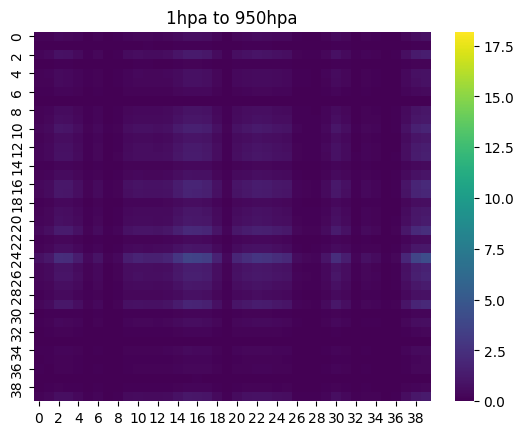

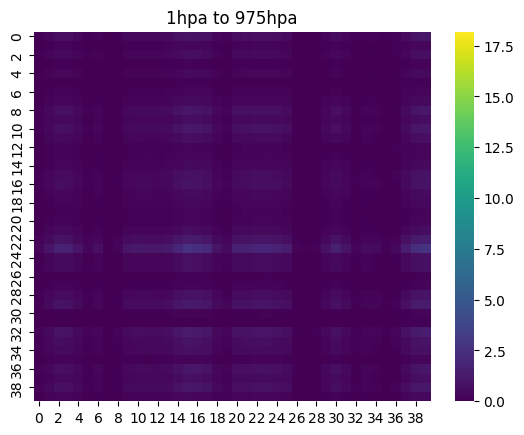

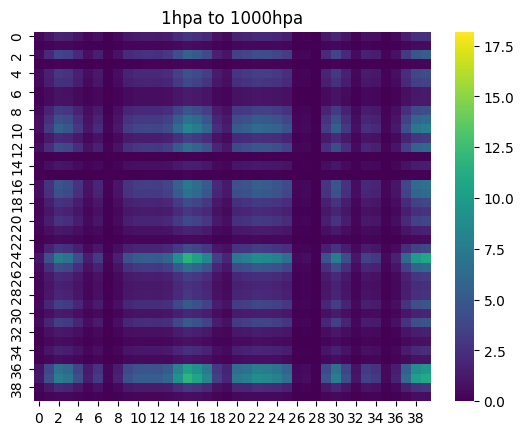

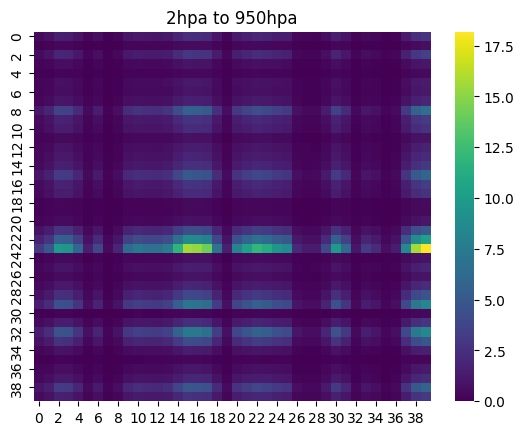

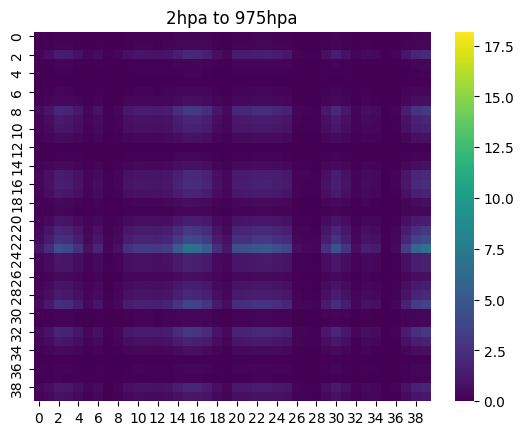

...

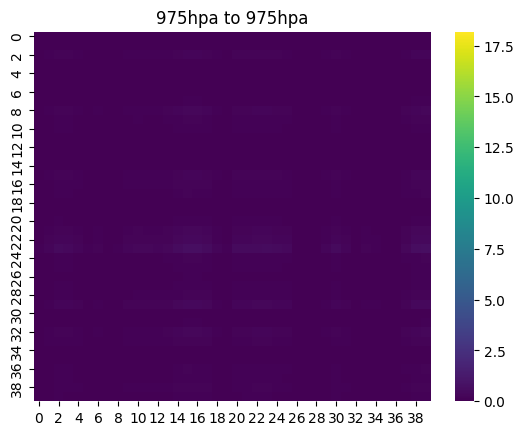

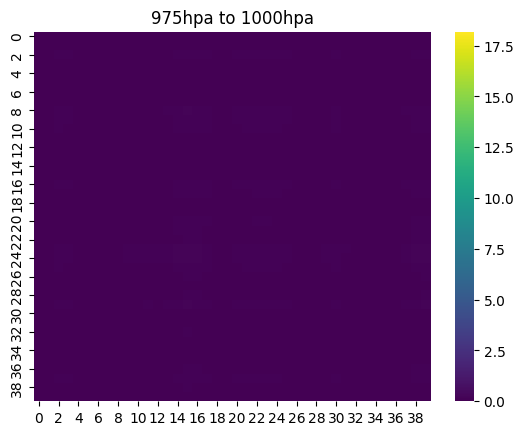

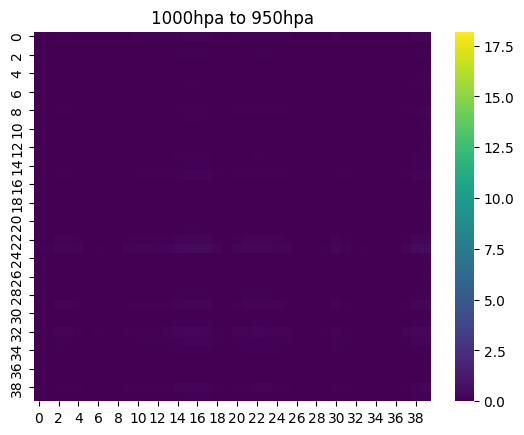

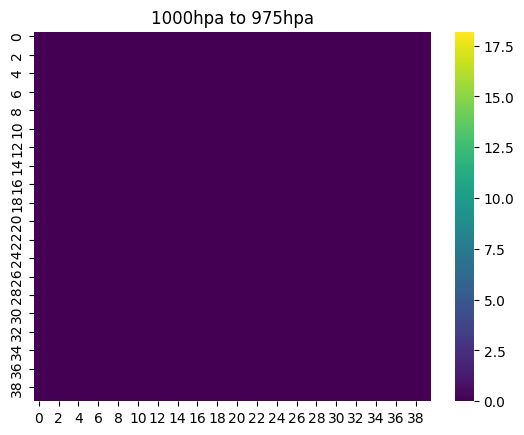

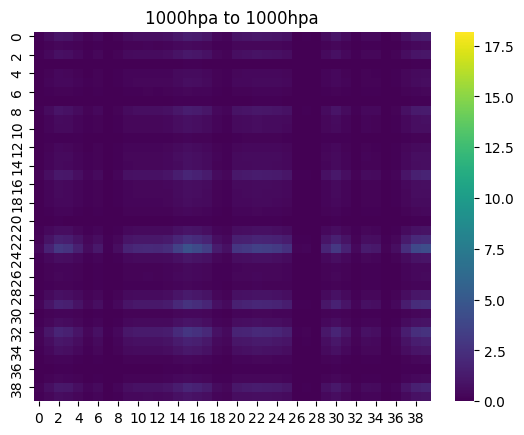

In [11]:
test_id = 'long_term_forecast_cov_qbo_daily_seqlen40_iTransformer_cov_QBO_ft-1_sl40_pl40_dm512_nh8_el4_dl1_df512_fc3_flocvali_first_lam0.001_dtTrue_Exp_0'
start = 12746
end = 13898
interval = 96
seq_len = 40
start_date = pd.to_datetime("1979/01/01", format="%Y/%m/%d")
level = [1,2,3,5,7,10,20,30,50,70,100,125,150, 175, 200, 225, 250, 300, 350, 400, 450,  500, 550,600, 650, 700, 750, 775, 800, 825, 850, 875, 900, 925, 950, 975, 1000]
for cause in level:#[20,30,750, 775, 800, 825, 850, 875, 900, 925, 950, 975, 1000]:
    for effect in [950, 975, 1000]:#[10,20,30,50,70]:
        i = 14762
        str_i = f'{i:04d}'
        time_start = start_date + pd.Timedelta(days=i+seq_len)
        time_end = time_start + pd.Timedelta(days=interval)
        time_str = time_start.strftime("%Y-%m-%d") + '--' + time_end.strftime("%Y-%m-%d")
        matrix = np.load(f'../results/jacobian/{test_id}/jac_{str_i}.npy')
        mat = np.abs(np.real(matrix))
        #mat = np.log(mat)
        mat_extract = extract_rows_with_interval(mat, start_row_index=level.index(cause), interval=37)
        mat_extract = extract_cols_with_interval(mat_extract, start_col_index=level.index(effect), interval=37)
        
        if mat.size > 0 and np.nanmin(mat) != np.nanmax(mat):
            min_val = np.nanmin(mat) # 使用 nanmin 来忽略NaN值
            max_val = np.nanmax(mat) # 使用 nanmax 来忽略NaN值
        elif mat.size > 0: # 如果所有值相同
            min_val = np.nanmin(mat) - 0.5 # 创建一个小的范围
            max_val = np.nanmax(mat) + 0.5
            if min_val == max_val : # 如果减去0.5后仍然相同（比如只有一个元素）
                    min_val = min_val - 1 # 确保有一个范围
                    max_val = max_val +1
        else: # 如果mat为空
            print(f"Skipping empty or invalid mat at index {i}")
            continue
            
        sns.heatmap(mat_extract,vmin=min_val, vmax=max_val, cmap="viridis") # cmap可以自行选择
        plt.title("{0}hpa to {1}hpa".format(cause,effect))
        plt.show()
        

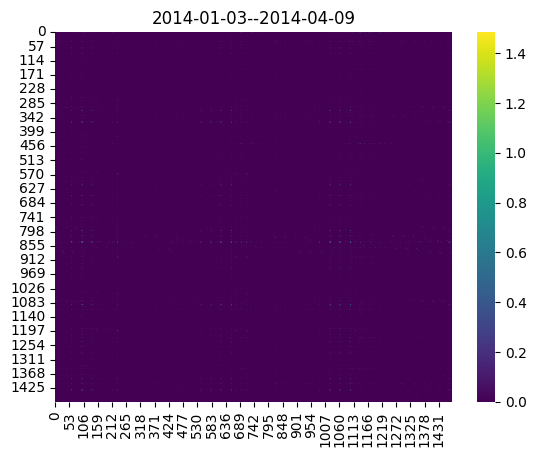

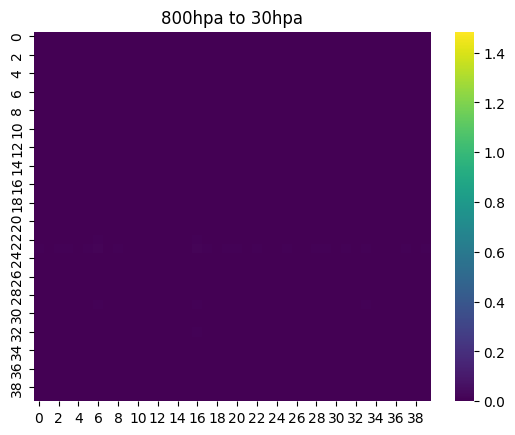

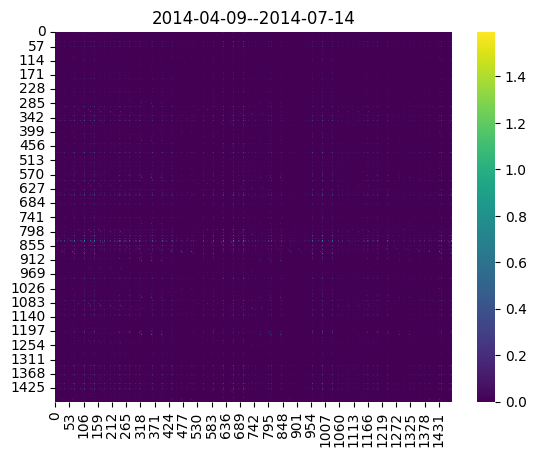

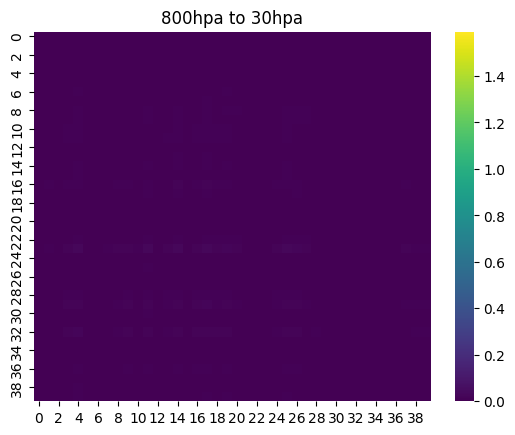

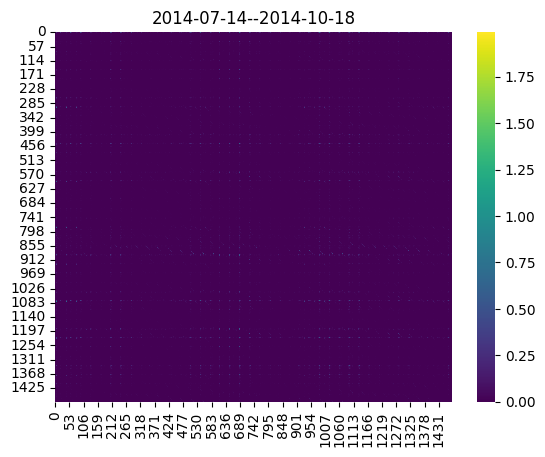

...

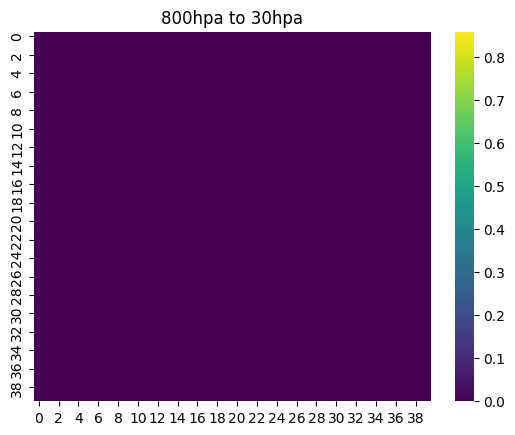

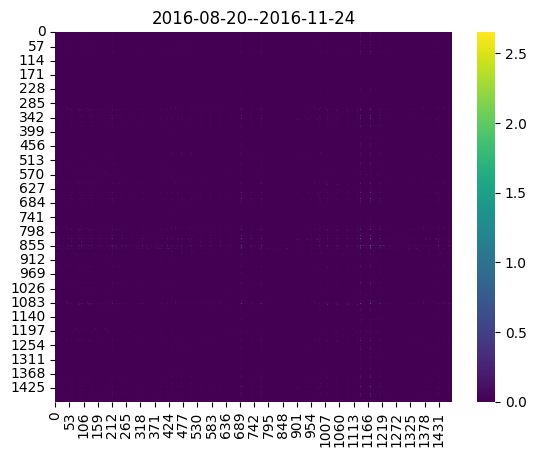

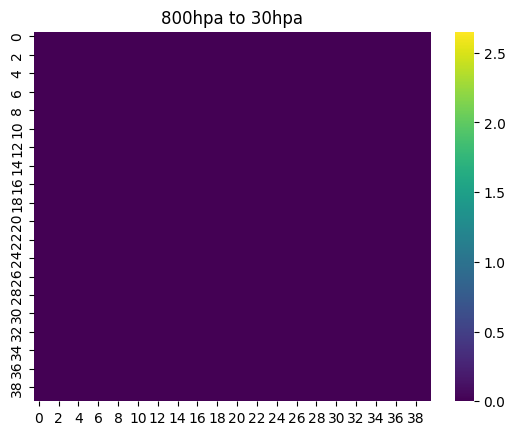

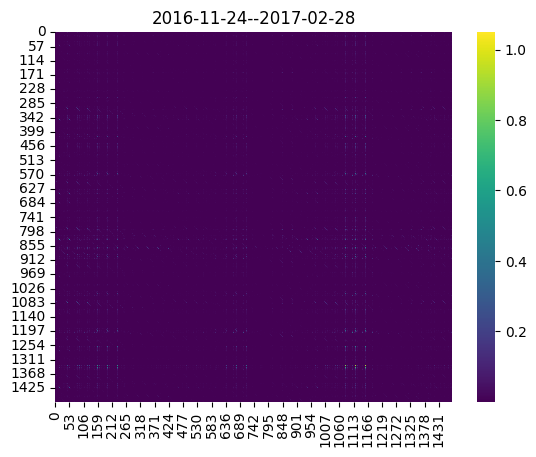

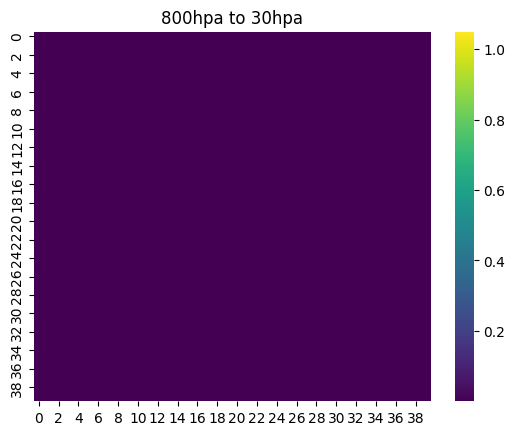

In [7]:
import numpy as np
import matplotlib.pyplot as plt
test_id = 'long_term_forecast_cov_qbo_daily_seqlen40_iTransformer_cov_QBO_ft-1_sl40_pl40_dm512_nh8_el4_dl1_df512_fc3_flocvali_first_lam0.001_dtTrue_Exp_0'
start = 12746
end = 13898
interval = 96
seq_len = 40
cause = 30
effect = 6
start_date = pd.to_datetime("1979/01/01", format="%Y/%m/%d")
for i in range(start, end, interval):
    str_i = f'{i:04d}'
    time_start = start_date + pd.Timedelta(days=i+seq_len)
    time_end = time_start + pd.Timedelta(days=interval)
    time_str = time_start.strftime("%Y-%m-%d") + '--' + time_end.strftime("%Y-%m-%d")
    matrix = np.load(f'../results/jacobian/{test_id}/jac_{str_i}.npy')
    mat = np.abs(np.real(matrix))
    mat_extract = extract_rows_with_interval(mat, start_row_index=28, interval=37)
    mat_extract = extract_cols_with_interval(mat_extract, start_col_index=7, interval=37)
    if mat.size > 0 and np.nanmin(mat) != np.nanmax(mat):
        min_val = np.nanmin(mat) # 使用 nanmin 来忽略NaN值
        max_val = np.nanmax(mat) # 使用 nanmax 来忽略NaN值
    elif mat.size > 0: # 如果所有值相同
        min_val = np.nanmin(mat) - 0.5 # 创建一个小的范围
        max_val = np.nanmax(mat) + 0.5
        if min_val == max_val : # 如果减去0.5后仍然相同（比如只有一个元素）
                min_val = min_val - 1 # 确保有一个范围
                max_val = max_val +1
    else: # 如果mat为空
        print(f"Skipping empty or invalid mat at index {i}")
        continue

    plt.figure() # 为每个heatmap创建一个新的figure，避免重叠
    sns.heatmap(mat, vmin=min_val, vmax=max_val, cmap="viridis") # cmap可以自行选择
    plt.title(time_str)
    plt.show()
    sns.heatmap(mat_extract,vmin=min_val, vmax=max_val, cmap="viridis") # cmap可以自行选择
    plt.title("{0}hpa to {1}hpa".format(level[28],level[7]))
    plt.show()
    # 2. 设置绘图参数
    # plt.figure(figsize=(8, 8), dpi=150)   # 调整画布大小和分辨率使之足够清晰
    # sns.heatmap(matrix)
    # plt.show()


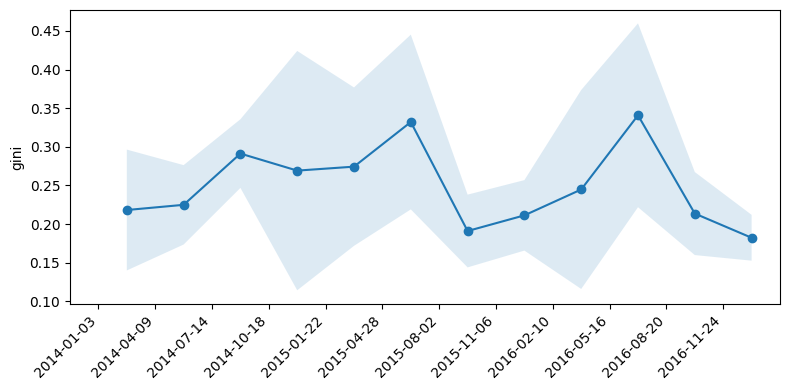

In [4]:
x_labels0 = list(gn_1516.keys())
x_labels = [i[:10] for i in x_labels0]
y_val = np.array(list(gn_1516.values()))
y_val_std = np.array(list(gn_1516_std.values()))
tick_positions = np.arange(len(x_labels))
marker_x_positions = tick_positions + 0.5

plt.figure(figsize=(8, 4))
plt.plot(marker_x_positions, y_val, marker='o', linestyle='-')
plt.fill_between(marker_x_positions, y_val+y_val_std, y_val-y_val_std, alpha=0.15)
plt.ylabel("gini")
plt.xticks(ticks=tick_positions, labels=x_labels, rotation=45, ha='right')
if len(marker_x_positions) > 0:
    plt.xlim(tick_positions[0] - 0.5, tick_positions[-1] + 0.5 + 0.5)
plt.tight_layout()
plt.show()

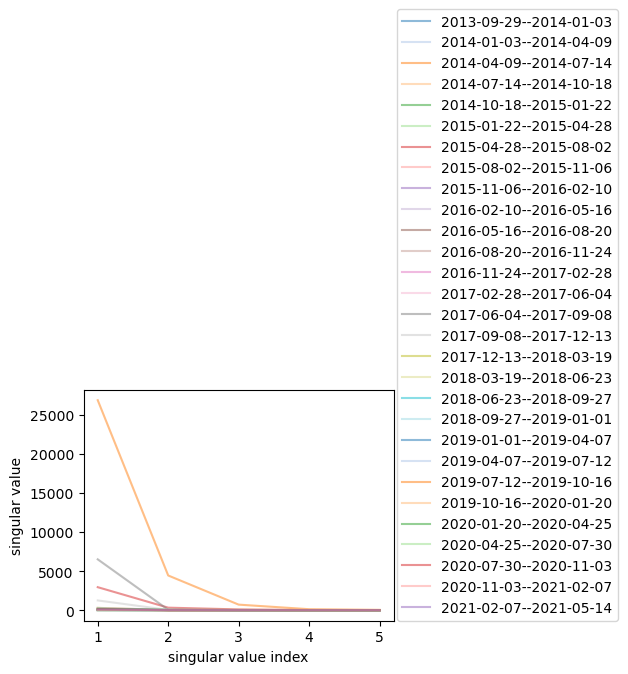

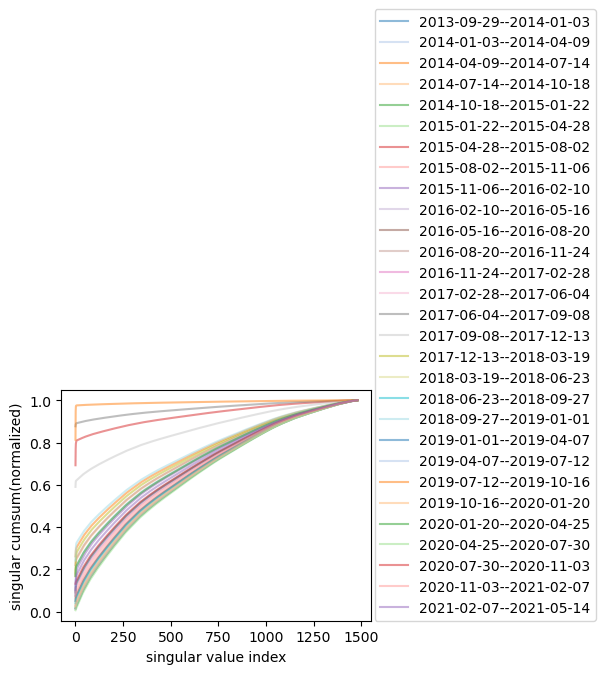

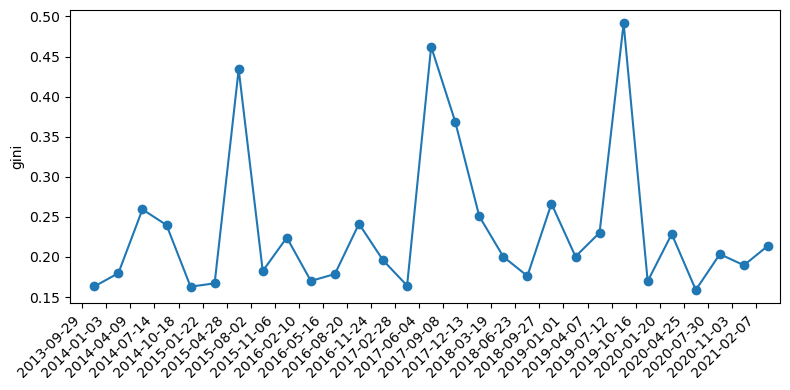

In [87]:
test_id = 'long_term_forecast_cov_daily_best_review_iTransformer_cov_QBO_ft-1_sl40_pl40_dm512_nh8_el4_dl1_df512_fc3_flocvali_first_lam0.001_dtTrue_Exp_'
start = 12650  #9096
end = 15434    #12552
interval = 96
seq_len = 40
#gn_all, gn_all_std, singular, us_all, vts, mats_all, Sigs = plot_singular_cum(test_id, eps=10, seed = 1, start=start, end=end, interval=interval, seq_len=seq_len, log_bool=False)
gn_all, gn_all_std, singular, us, vts, mats, Sigs = plot_singular_cum(test_id, eps='all', seed = 1, start=start, end=end, interval=interval, seq_len=seq_len, log_bool=False)
plot_gini(gn_all, gn_all_std)

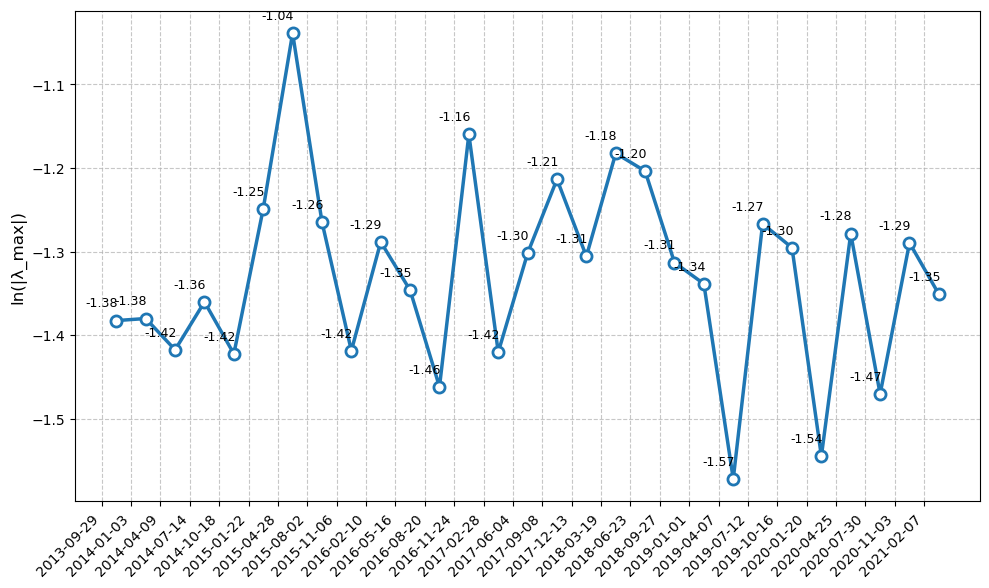

In [88]:
start = 12650  #9096
end = 15434    #12552
macro_analysis(us, mats, start, end, interval)

/home/yuanbing/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


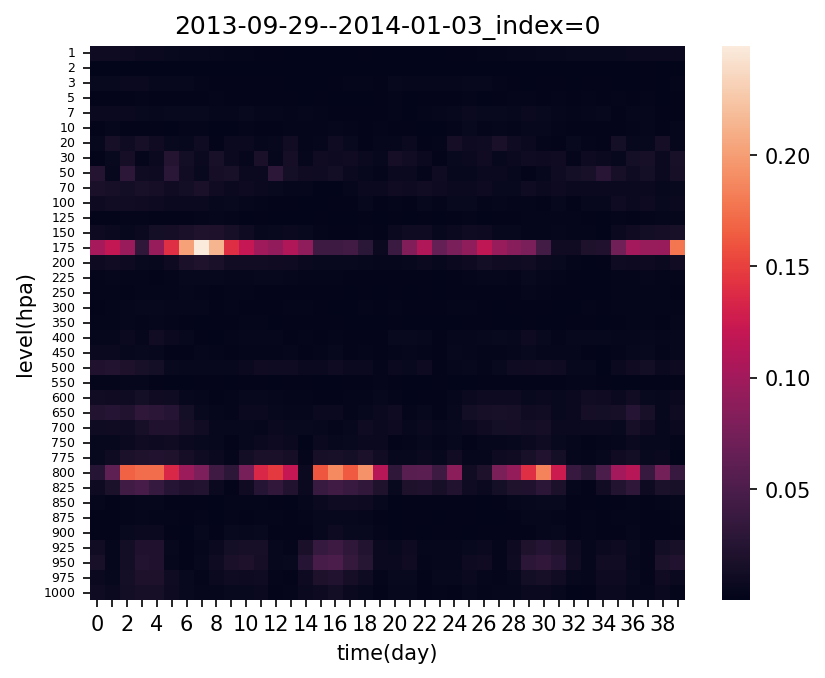

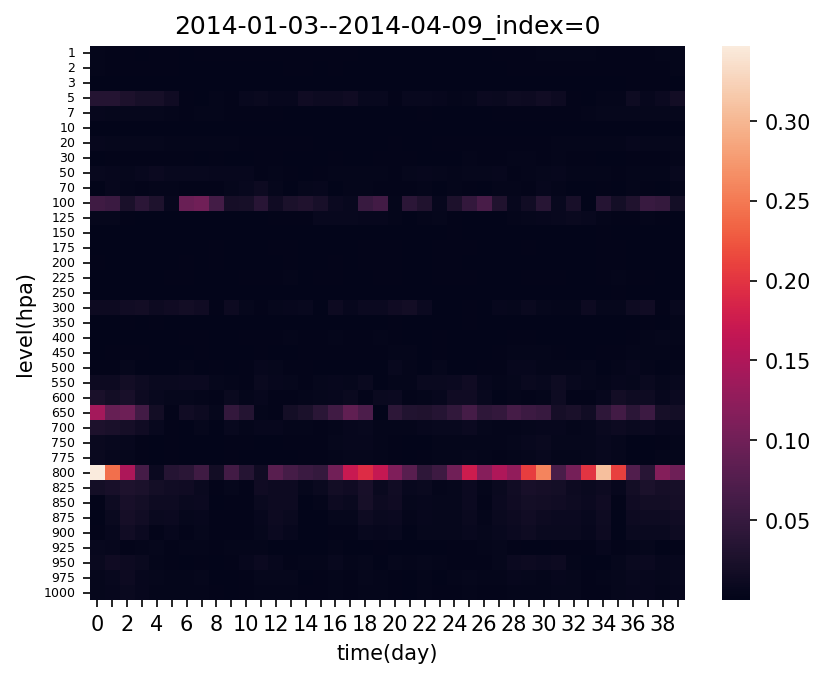

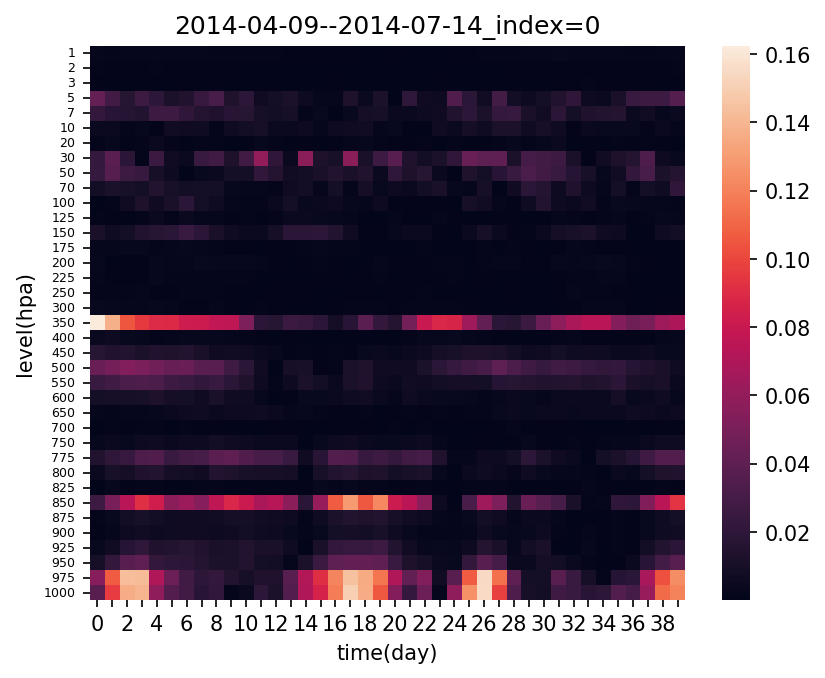

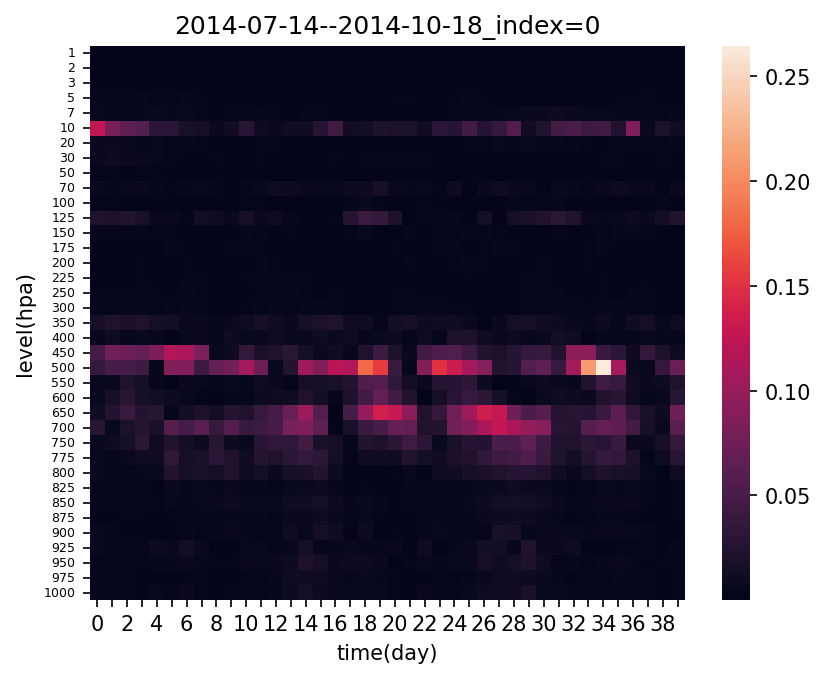

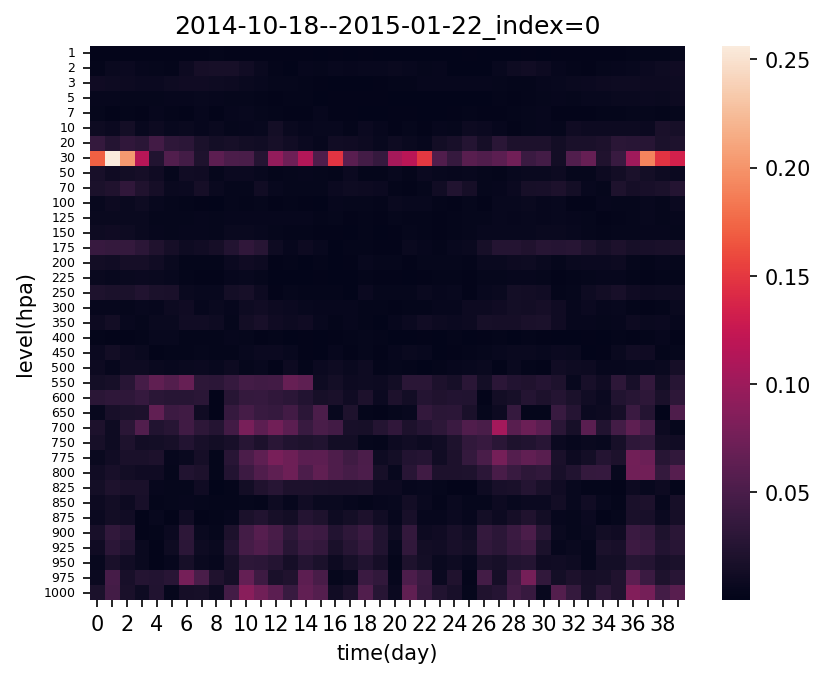

...

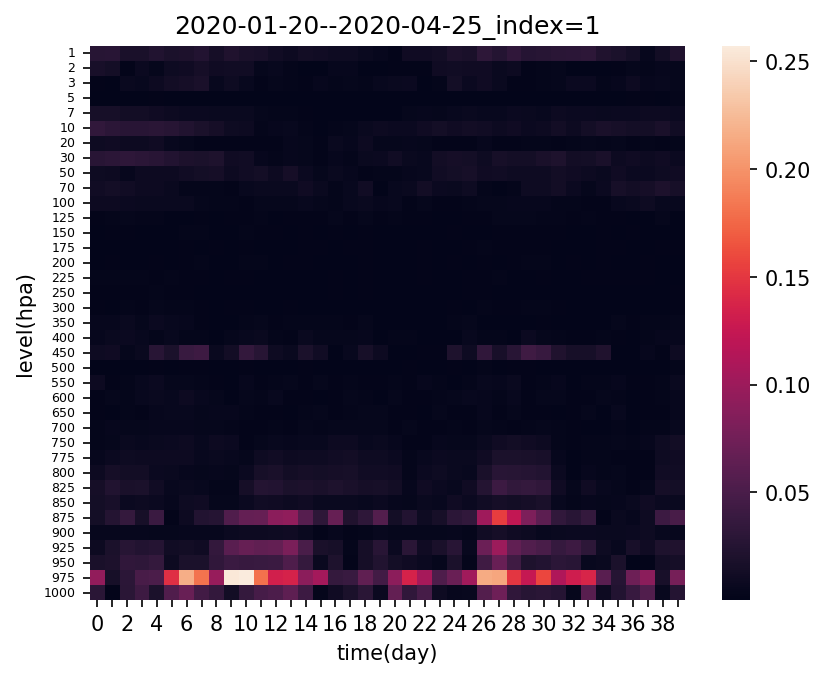

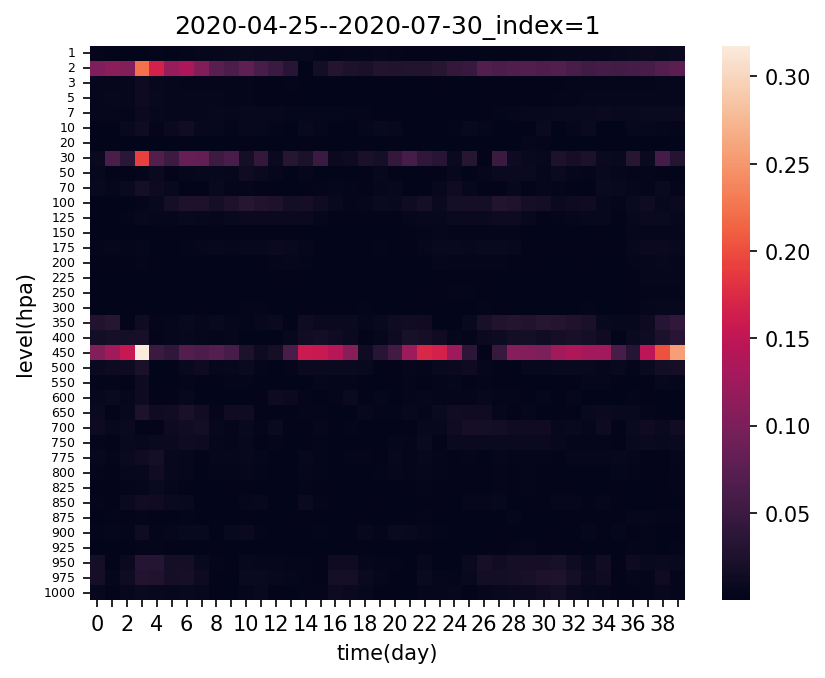

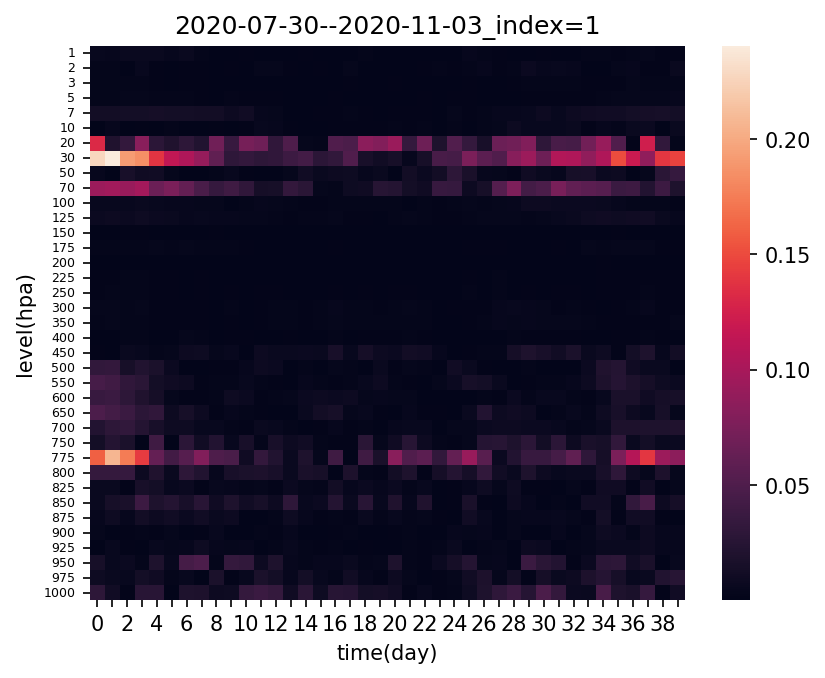

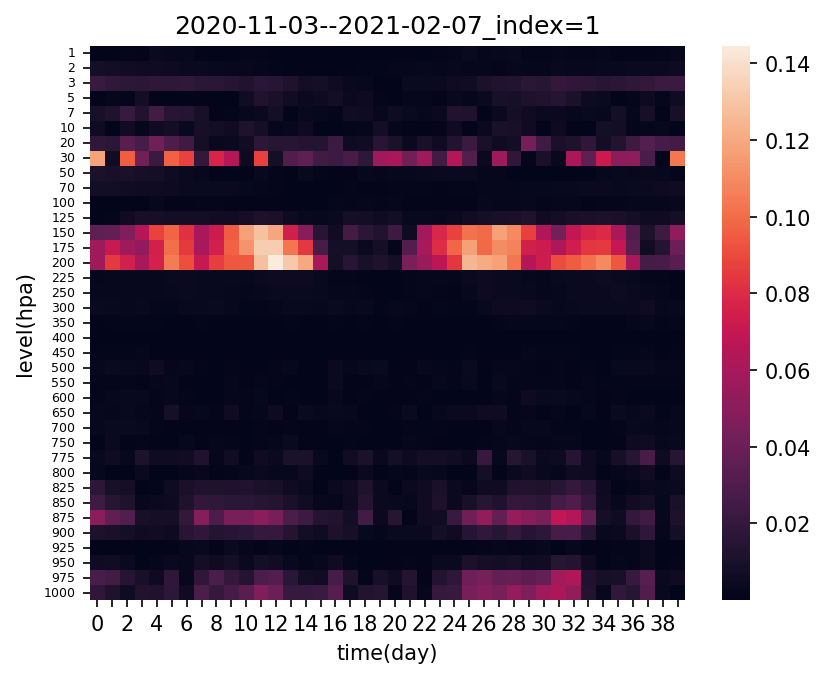

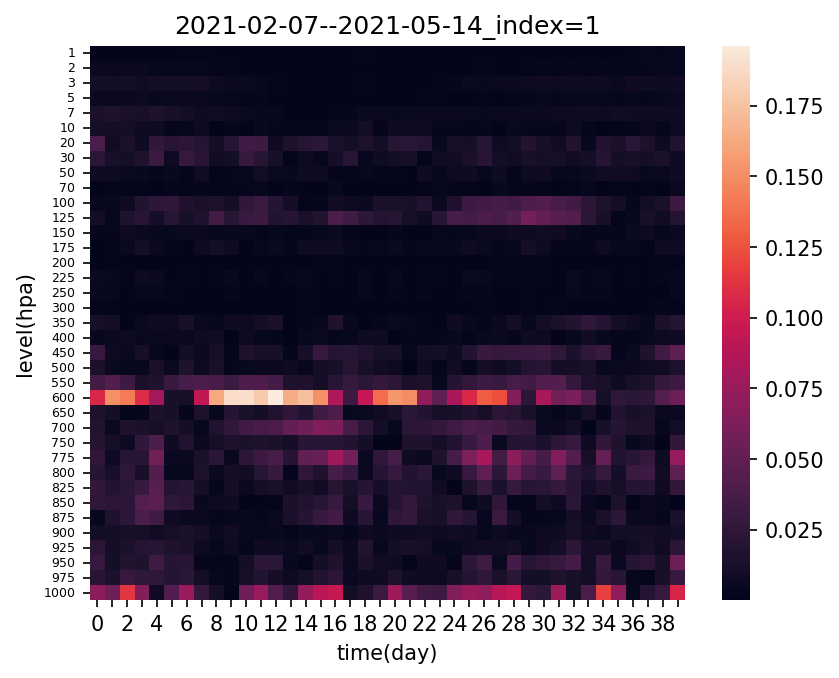

In [89]:
analysis_u(us, seq_len=40, dims=37, start=start, end=end, interval=interval, target=[0,1])

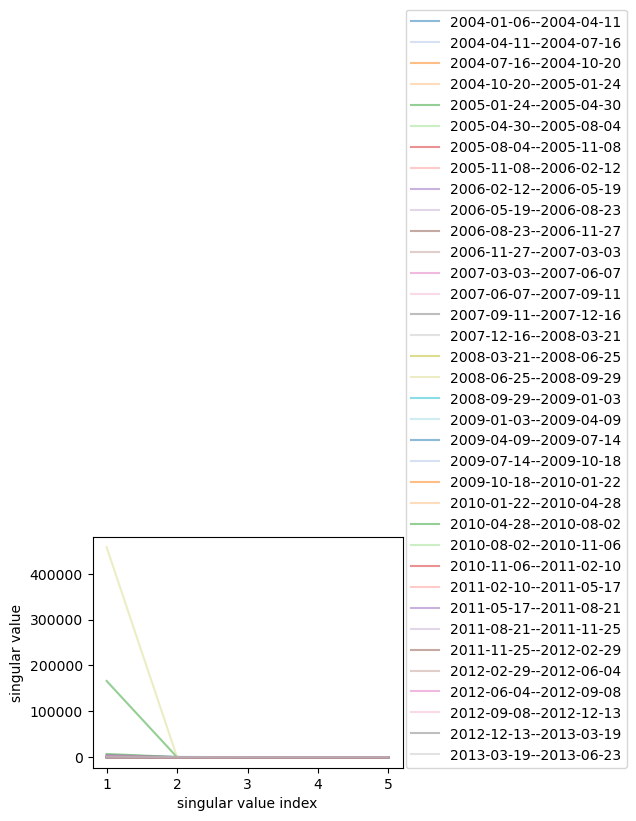

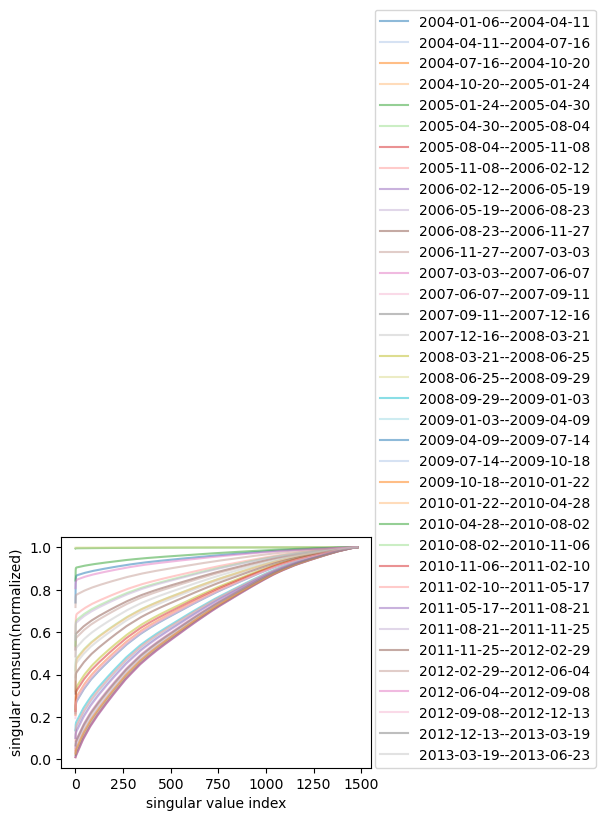

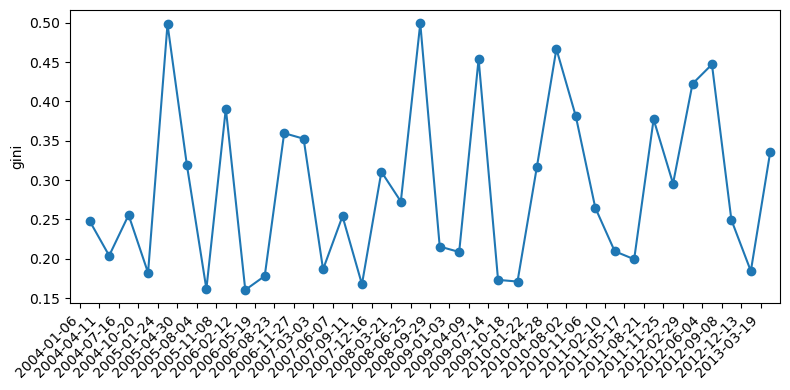

In [84]:
test_id = 'long_term_forecast_cov_daily_best_review_iTransformer_cov_QBO_ft-1_sl40_pl40_dm512_nh8_el4_dl1_df512_fc3_flocvali_first_lam0.001_dtTrue_Exp_'
start = 9096
end = 12552
interval = 96
seq_len = 40
#gn_all, gn_all_std, singular, us_all, vts, mats_all, Sigs = plot_singular_cum(test_id, eps=10, seed = 1, start=start, end=end, interval=interval, seq_len=seq_len, log_bool=False)
gn_all, gn_all_std, singular, us, vts, mats, Sigs = plot_singular_cum(test_id, eps='all', seed = 1, start=start, end=end, interval=interval, seq_len=seq_len, log_bool=False)
plot_gini(gn_all, gn_all_std)

拟合参数A, a, b: [0.26764311 0.14160363 0.38938875]


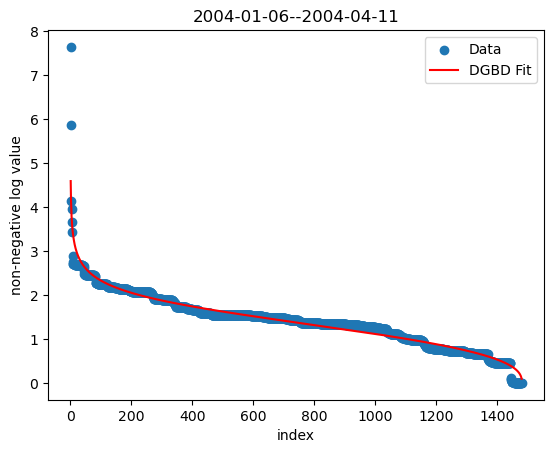

拟合参数A, a, b: [0.170748   0.11140379 0.42897311]


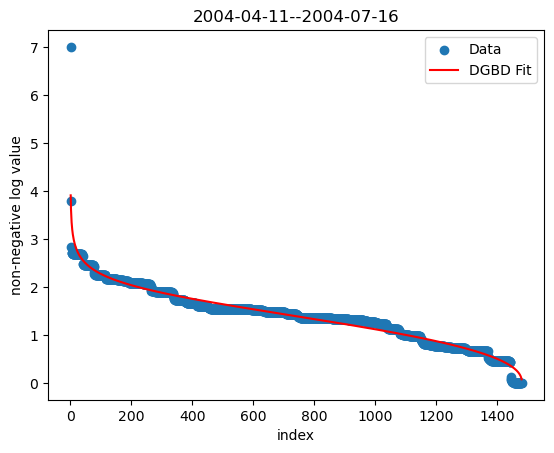

拟合参数A, a, b: [0.33525165 0.1572262  0.37027847]


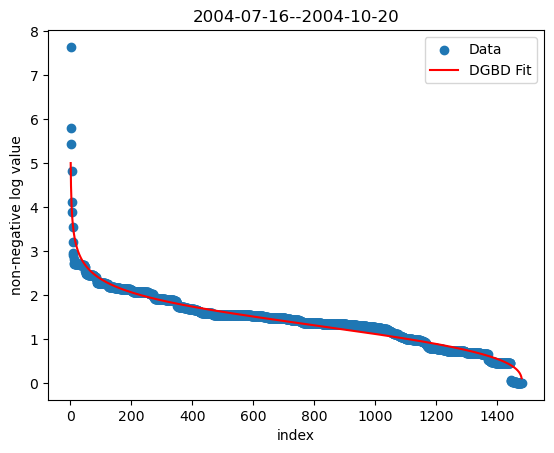

拟合参数A, a, b: [0.1946994  0.12060129 0.41813712]


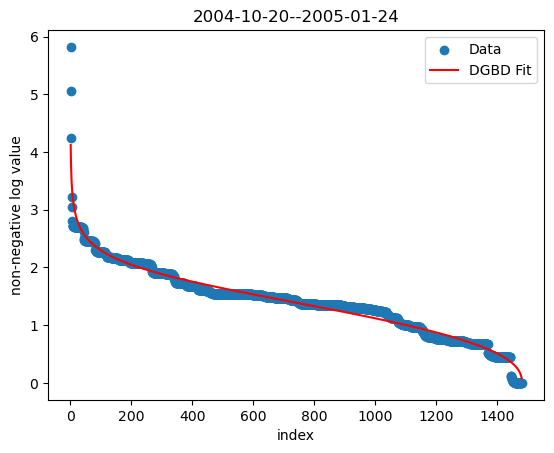

拟合参数A, a, b: [0.7402652  0.20998495 0.29772595]


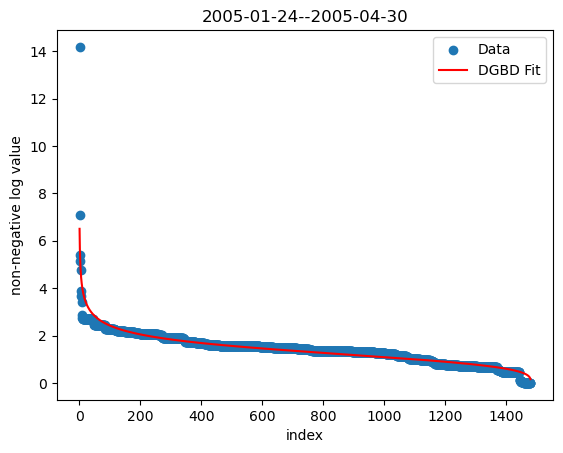

拟合参数A, a, b: [0.32161461 0.15465733 0.37356802]


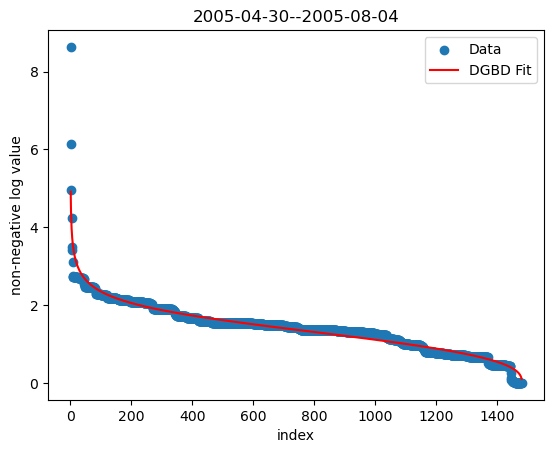

拟合参数A, a, b: [0.13477657 0.09637651 0.45098843]


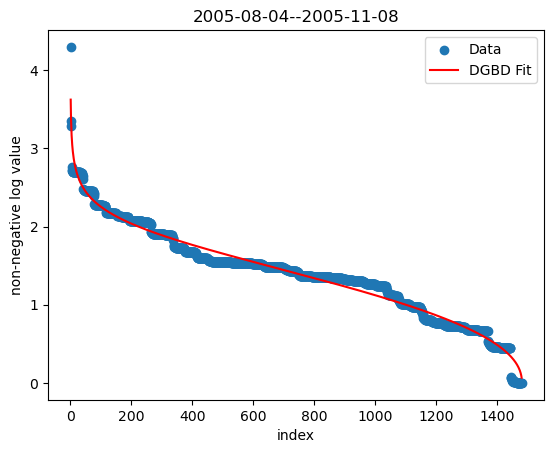

拟合参数A, a, b: [0.49827009 0.18351904 0.3344252 ]


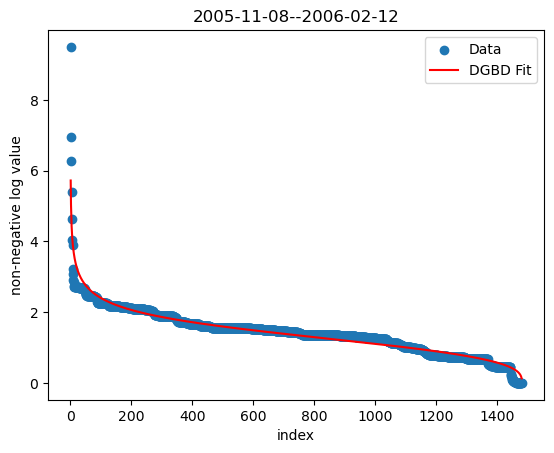

拟合参数A, a, b: [0.12632233 0.09226026 0.45678125]


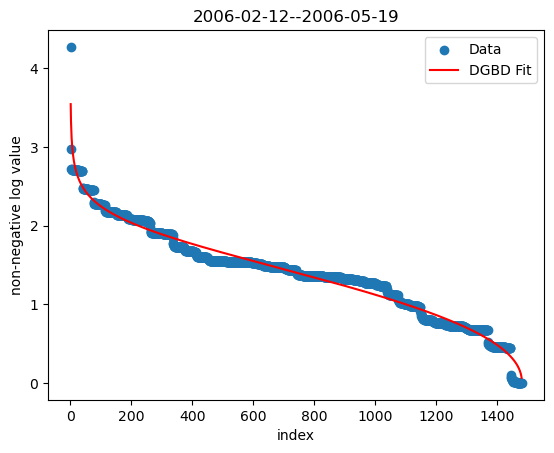

拟合参数A, a, b: [0.16357733 0.10947792 0.43375927]


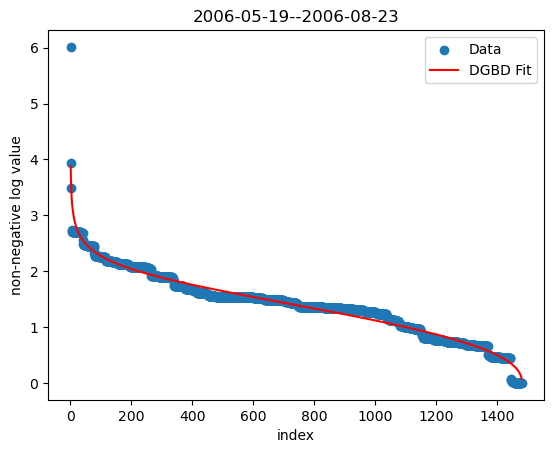

拟合参数A, a, b: [0.32727895 0.15458959 0.37085825]


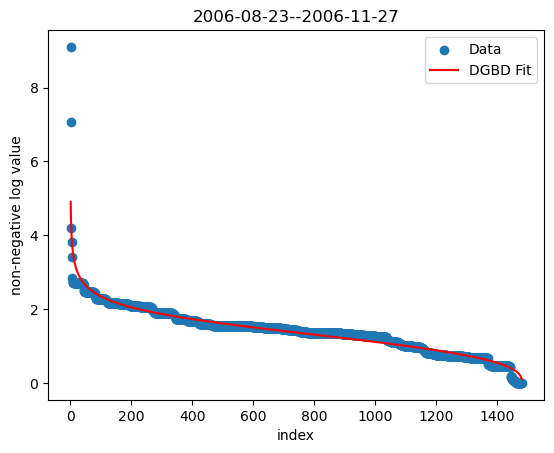

拟合参数A, a, b: [0.3867357  0.16650315 0.35653502]


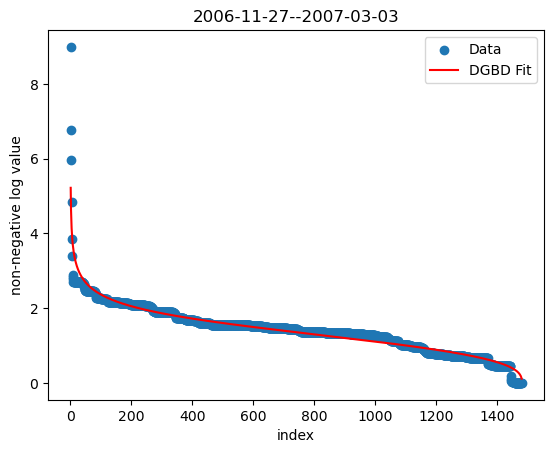

拟合参数A, a, b: [0.22127528 0.12980541 0.40765965]


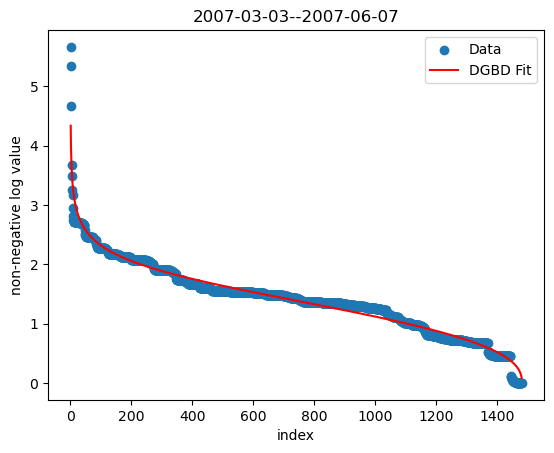

拟合参数A, a, b: [0.26180365 0.14012941 0.39116106]


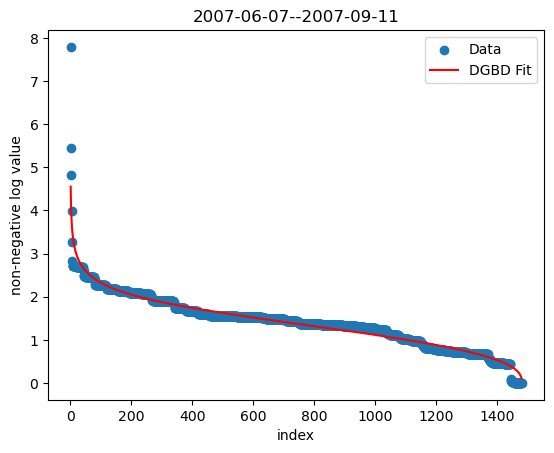

拟合参数A, a, b: [0.15396506 0.10554509 0.43956034]


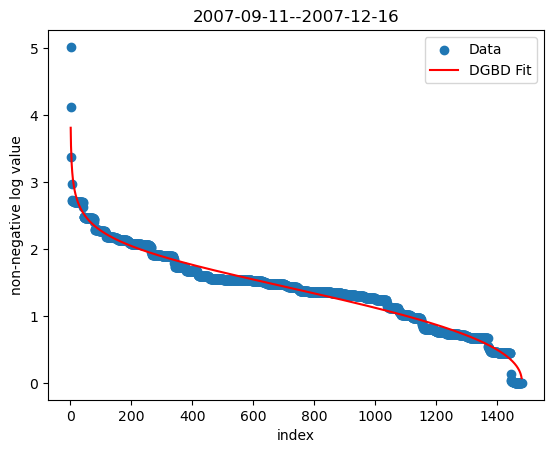

拟合参数A, a, b: [0.30391422 0.14916181 0.37676361]


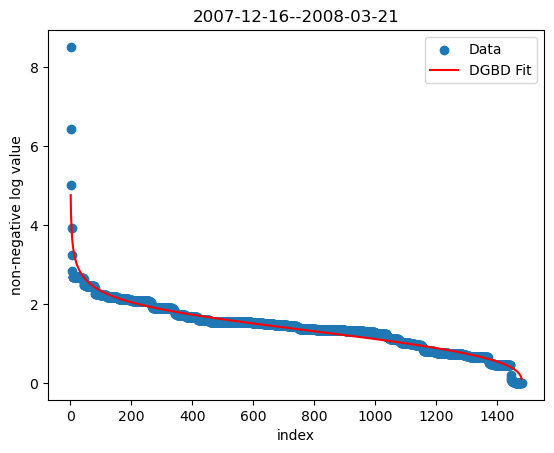

拟合参数A, a, b: [0.3989044  0.1697352  0.35563329]


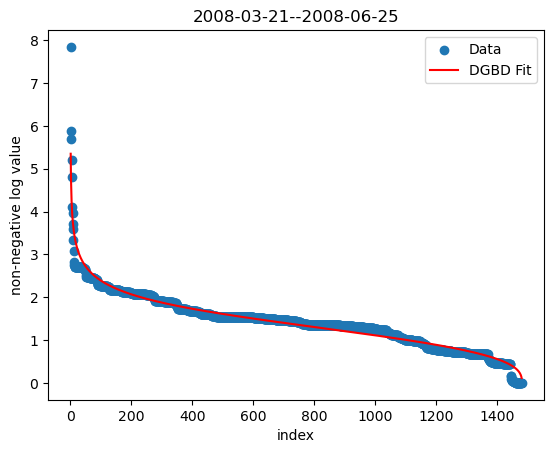

拟合参数A, a, b: [0.77621807 0.21306738 0.29334947]


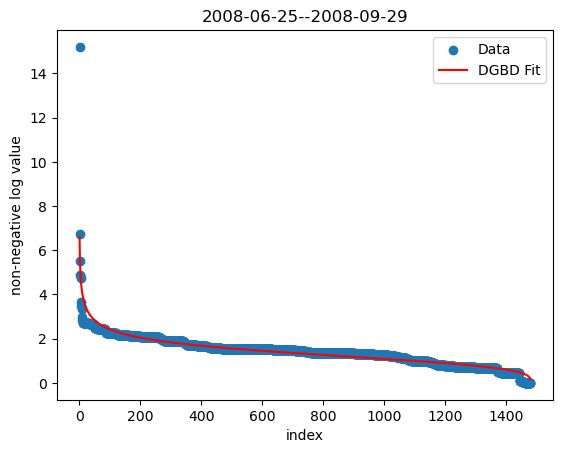

拟合参数A, a, b: [0.22079541 0.12955902 0.40706898]


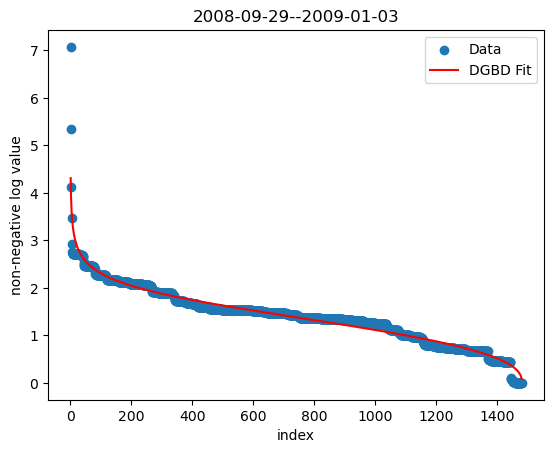

拟合参数A, a, b: [0.24415583 0.13505187 0.39713213]


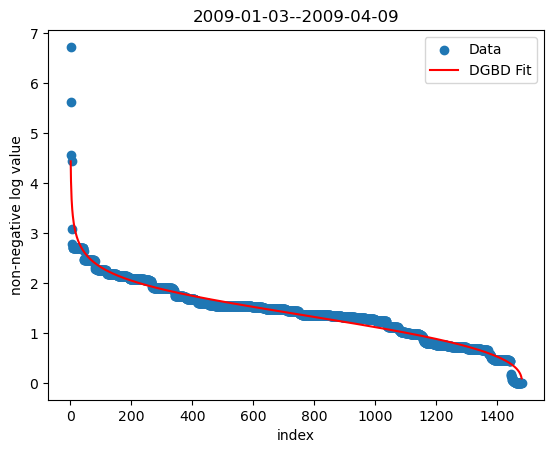

拟合参数A, a, b: [0.6450295  0.202566   0.31219394]


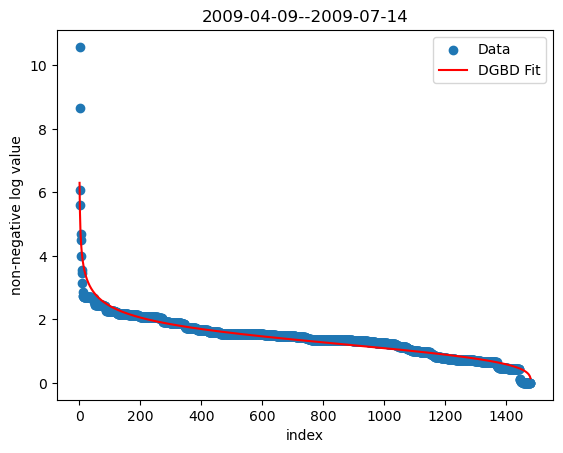

拟合参数A, a, b: [0.17602044 0.11387499 0.42705037]


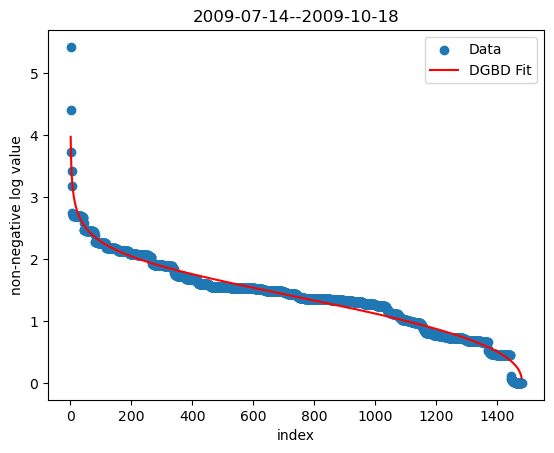

拟合参数A, a, b: [0.17210293 0.11124924 0.42818935]


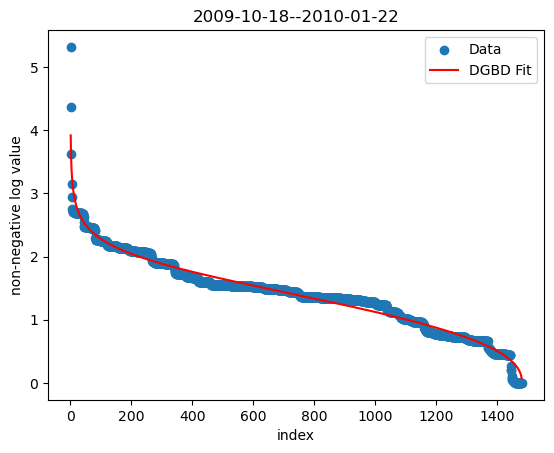

拟合参数A, a, b: [0.47176263 0.18059236 0.34003877]


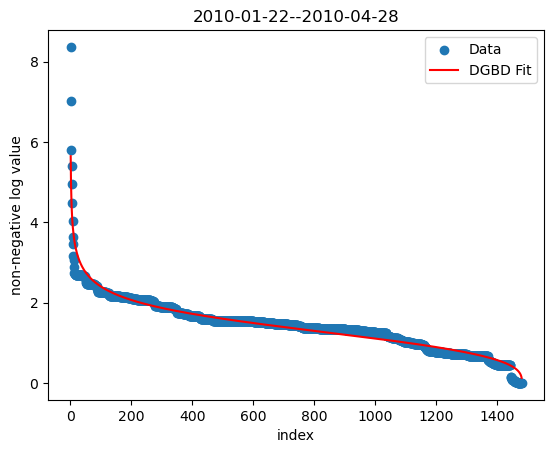

拟合参数A, a, b: [0.56229107 0.19173094 0.3227088 ]


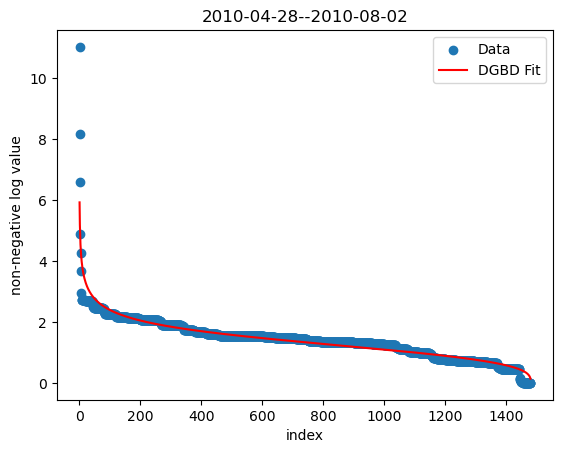

拟合参数A, a, b: [0.41065569 0.17110663 0.35154316]


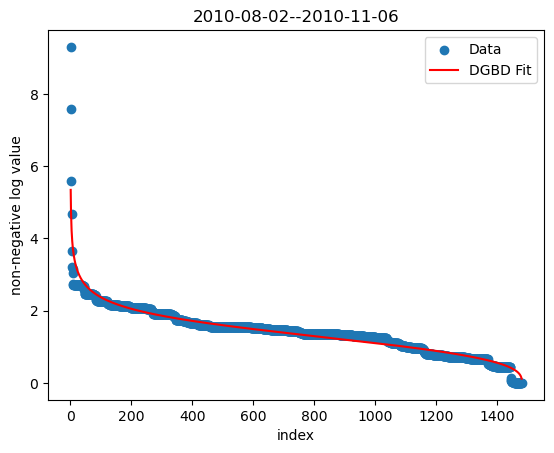

拟合参数A, a, b: [0.30472161 0.14947428 0.37693403]


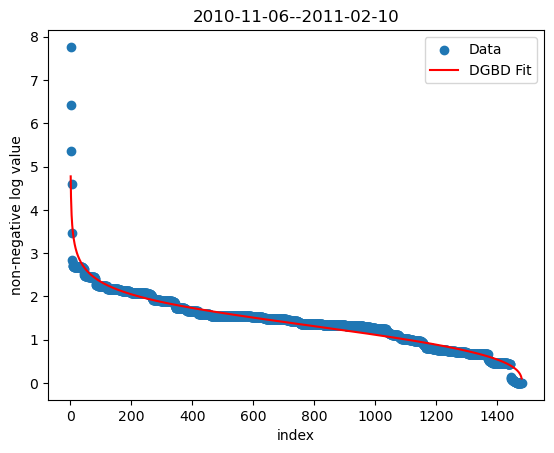

拟合参数A, a, b: [0.25948041 0.1401822  0.39305825]


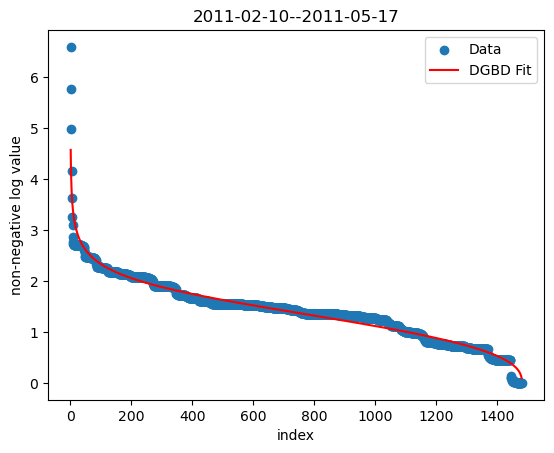

拟合参数A, a, b: [0.20153449 0.12304245 0.41507842]


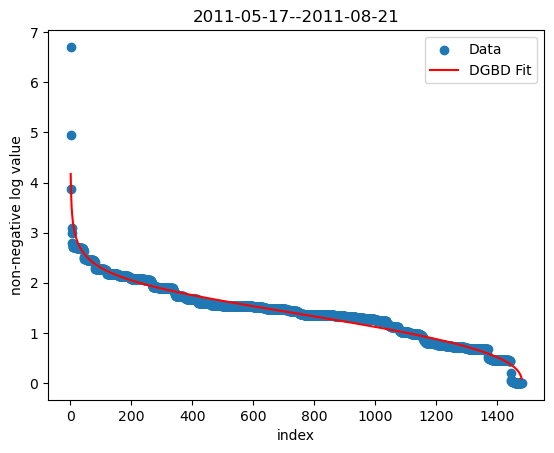

拟合参数A, a, b: [0.36092623 0.16225182 0.36278911]


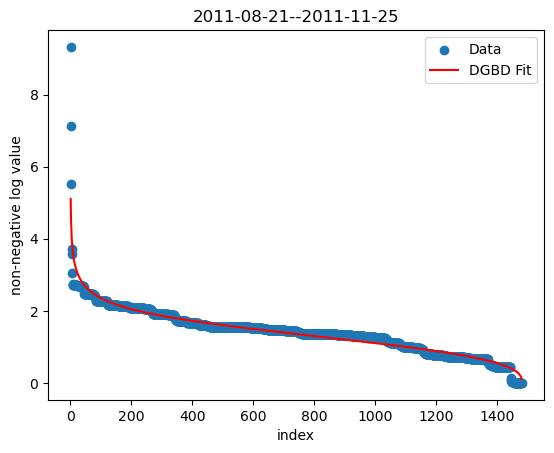

拟合参数A, a, b: [0.33281364 0.15541521 0.3692689 ]


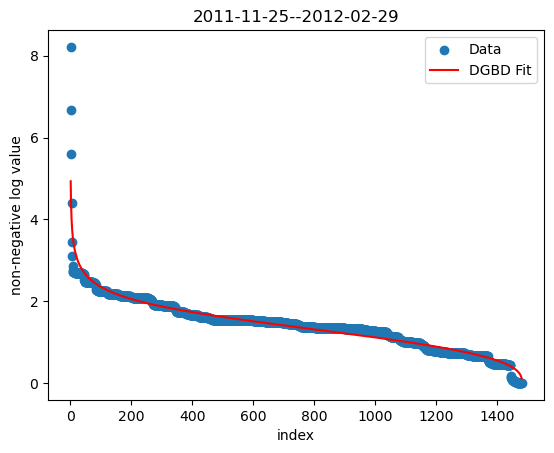

拟合参数A, a, b: [0.42920945 0.1734632  0.34695818]


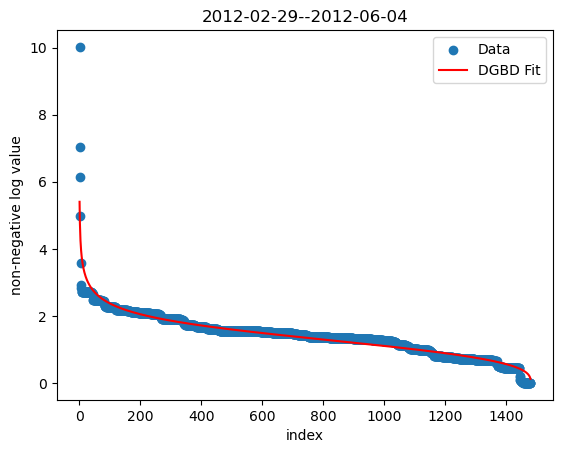

拟合参数A, a, b: [0.56045784 0.19256243 0.32484141]


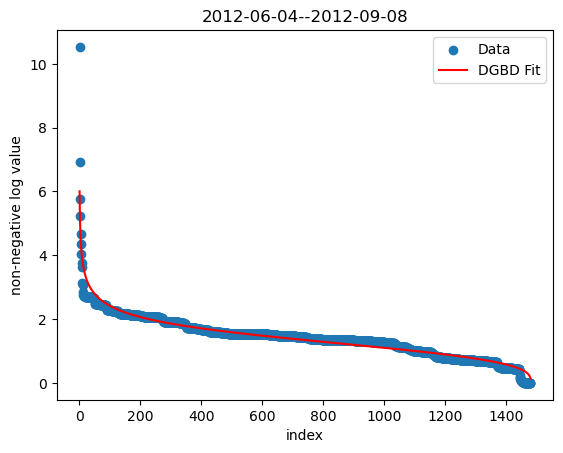

拟合参数A, a, b: [0.29535351 0.14856028 0.38113806]


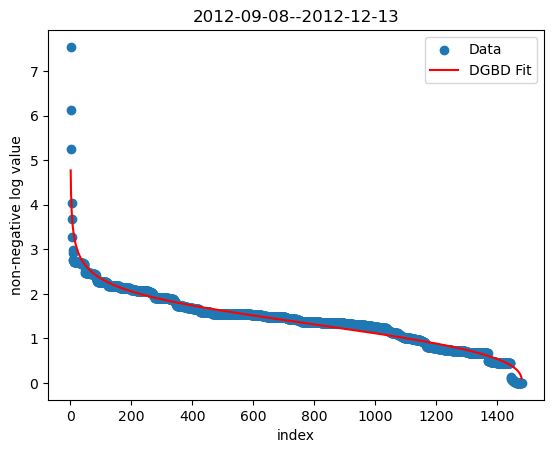

拟合参数A, a, b: [0.18189427 0.11548358 0.4234803 ]


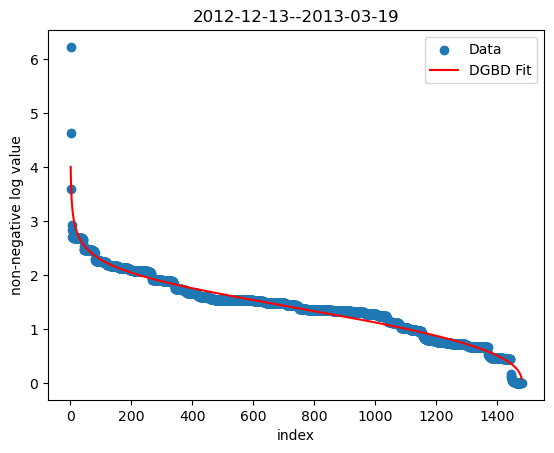

拟合参数A, a, b: [0.39415787 0.167078   0.35438217]


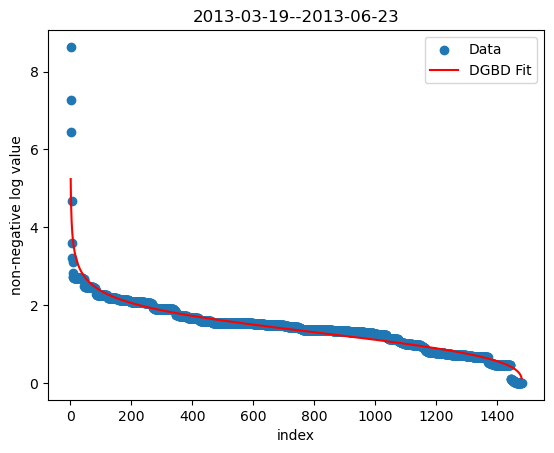

In [85]:
start = 9096 #12650
end = 12552 #15434   
interval = 96
start_date = pd.to_datetime("1979/01/01", format="%Y/%m/%d")
A_dic = {}
A_dic_std={}
a_dic={}
b_dic={}
for i in range(start, end, interval):
    time_start = start_date + pd.Timedelta(days=i+seq_len)
    time_end = time_start + pd.Timedelta(days=interval)
    time_str = time_start.strftime("%Y-%m-%d") + '--' + time_end.strftime("%Y-%m-%d")
    s = np.array(singular[i][0])
    s_log = np.log(s)
    s_min = np.min(s_log)
    if s_min < 0:
        s_log = s_log + np.abs(s_min)
    x = np.arange(1, len(s)+1)    
    
    param = dgbd_fit(x, s_log, p0=[0.5, 0.5, 0.5], title=time_str)
    A_dic[time_str] = param[0]
    A_dic_std[time_str] = 0
    a_dic[time_str] = param[1]
    b_dic[time_str] = param[2]

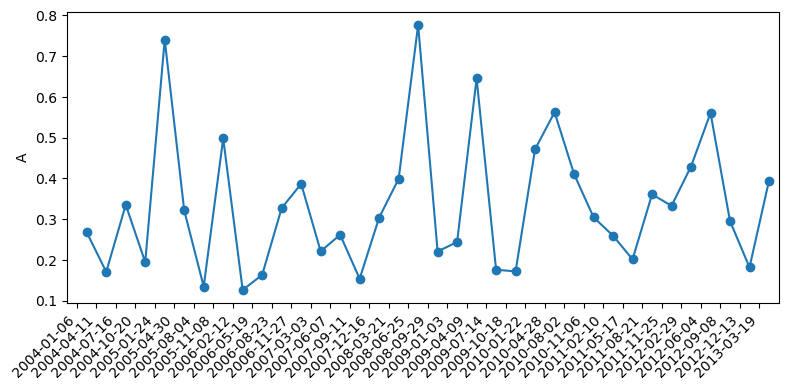

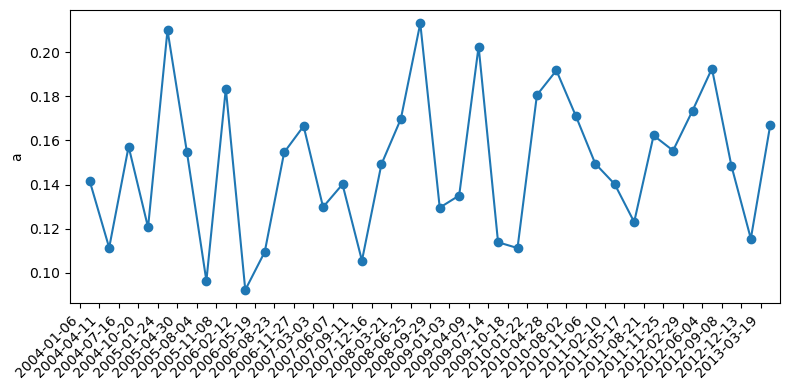

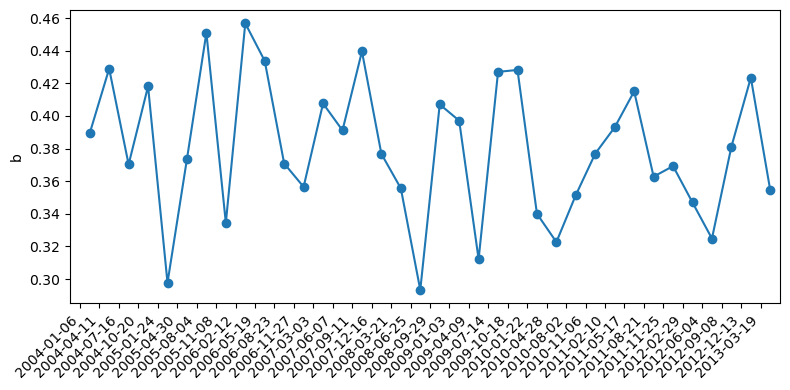

In [86]:
plot_ce_index(A_dic, A_dic_std, y_lab = "A")
plot_ce_index(a_dic, A_dic_std, y_lab = "a")
plot_ce_index(b_dic, A_dic_std, y_lab = "b")

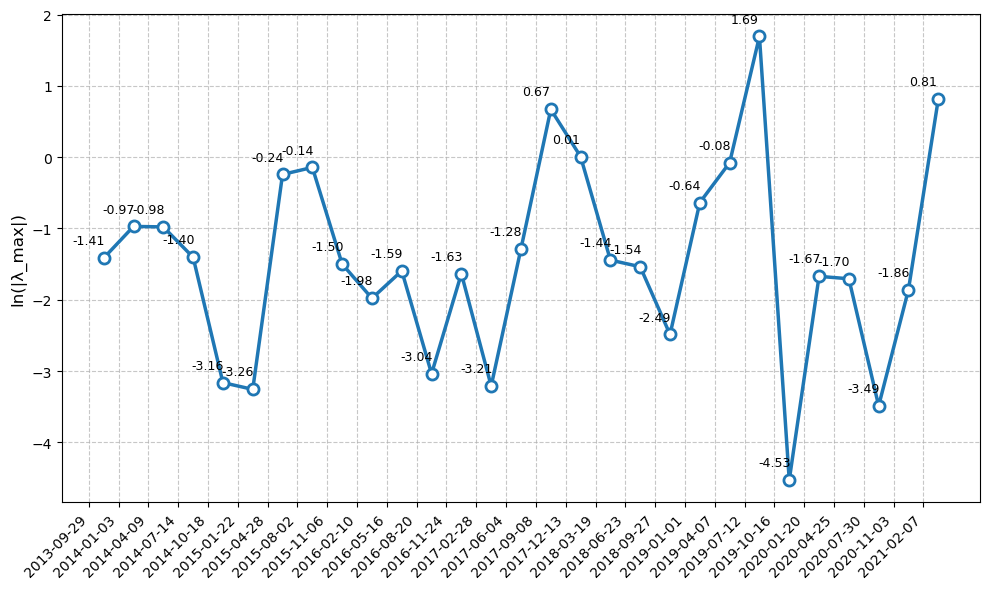

In [58]:
start = 12650  #9096
end = 15434    #12552
macro_analysis(us_all, mats_all, start, end, interval)

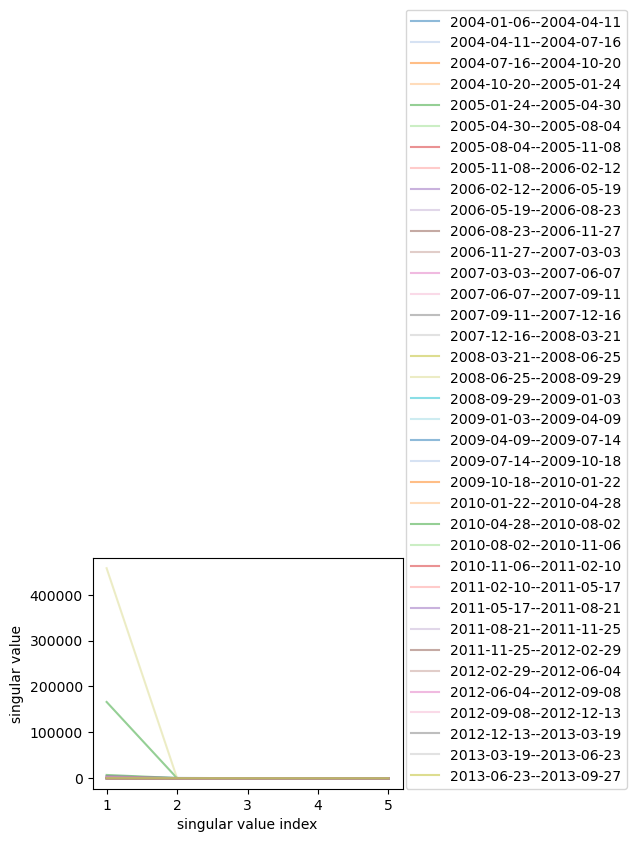

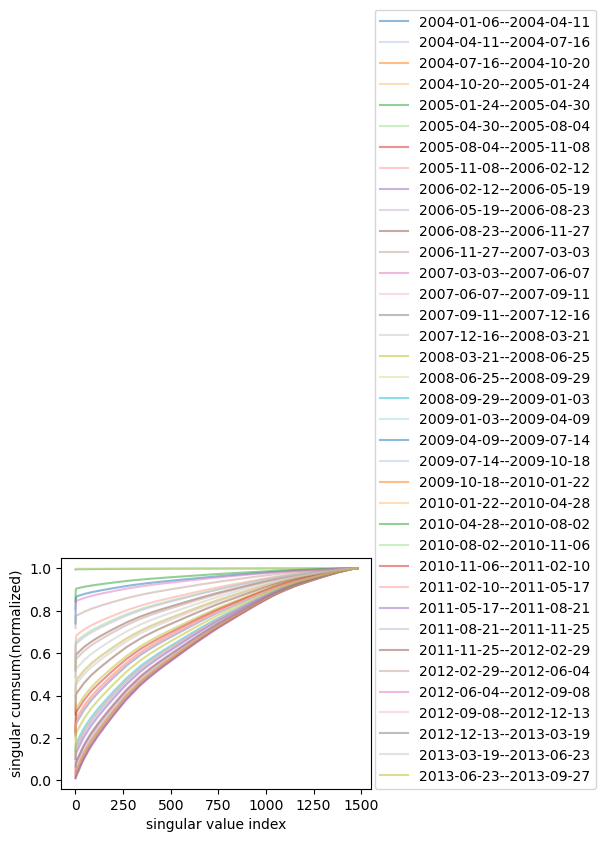

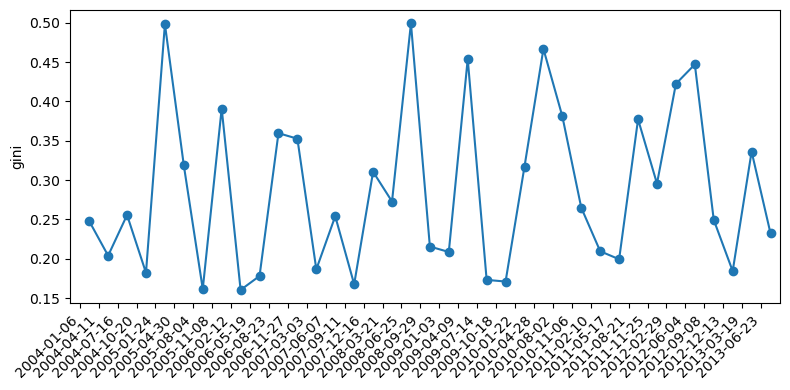

In [60]:
test_id = 'long_term_forecast_cov_daily_best_review_iTransformer_cov_QBO_ft-1_sl40_pl40_dm512_nh8_el4_dl1_df512_fc3_flocvali_first_lam0.001_dtTrue_Exp_'
start = 9096
end = 12648
interval = 96
seq_len = 40
#gn_before, gn_before_std, singular, us_before, vts, mats_before, Sigs = plot_singular_cum(test_id, eps=10, seed = 1, start=start, end=end, interval=interval, seq_len=seq_len, log_bool=False)
gn_before, gn_before_std, singular, us, vts, mats, Sigs = plot_singular_cum(test_id, eps='all', seed = 1, start=start, end=end, interval=interval, seq_len=seq_len, log_bool=False)
plot_gini(gn_before, gn_before_std)

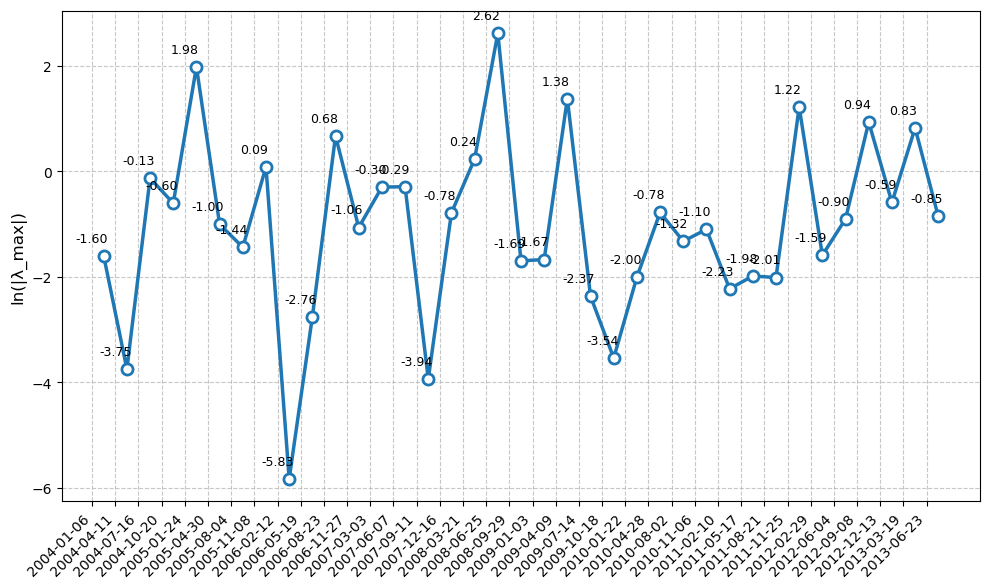

In [56]:
macro_analysis(us_before, mats_before, start, end, interval)

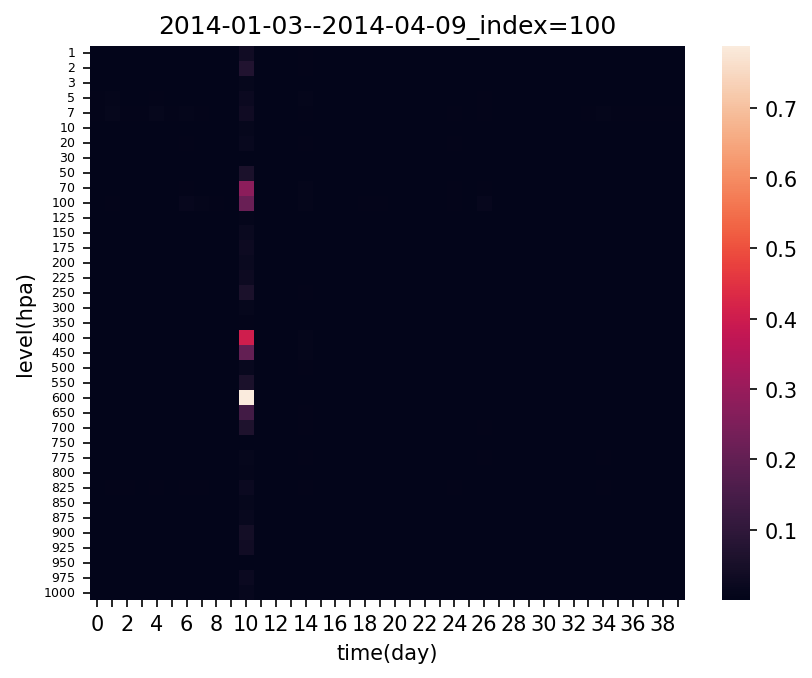

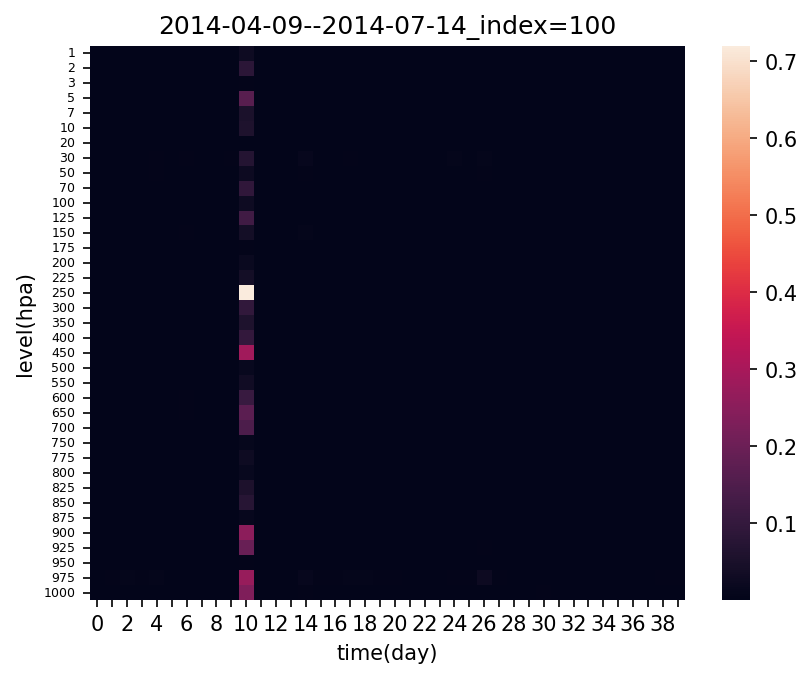

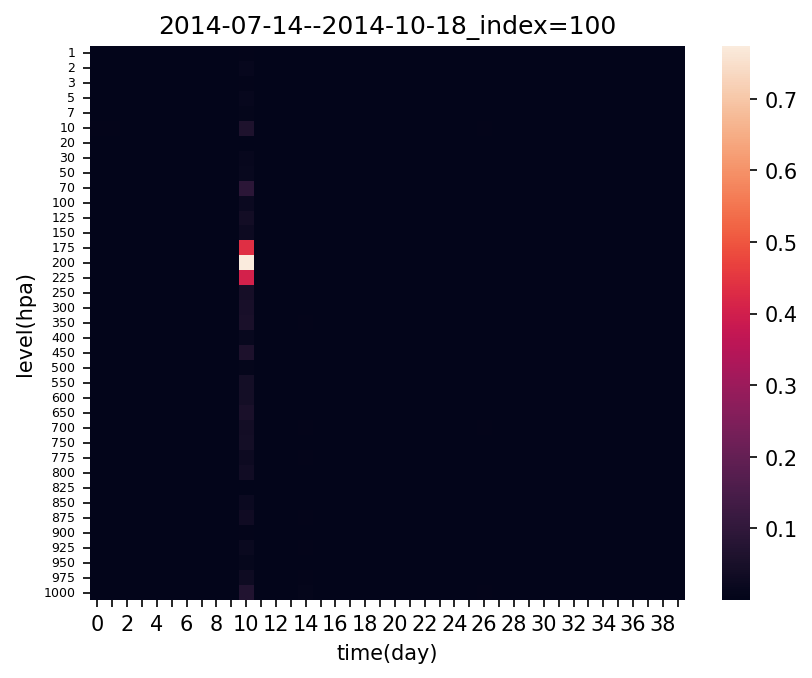

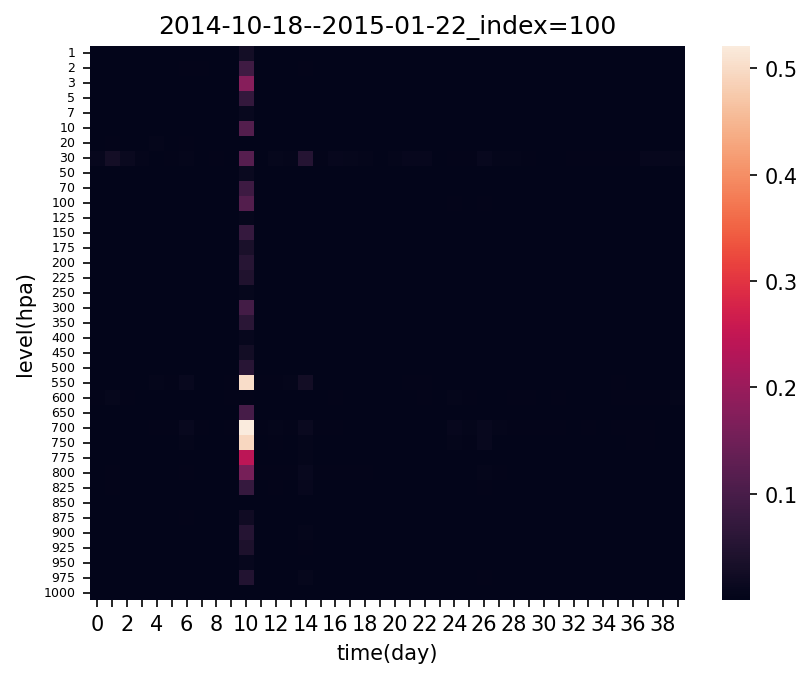

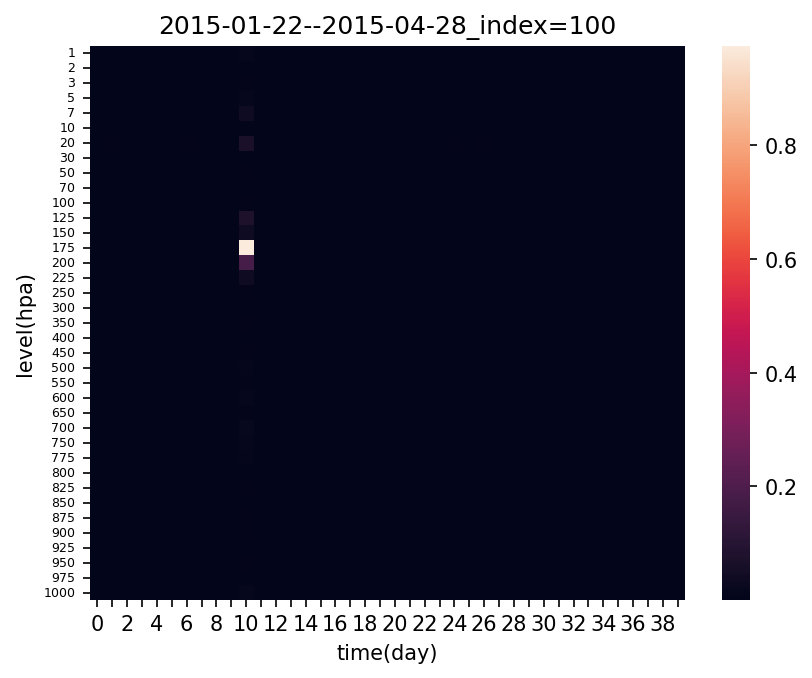

...

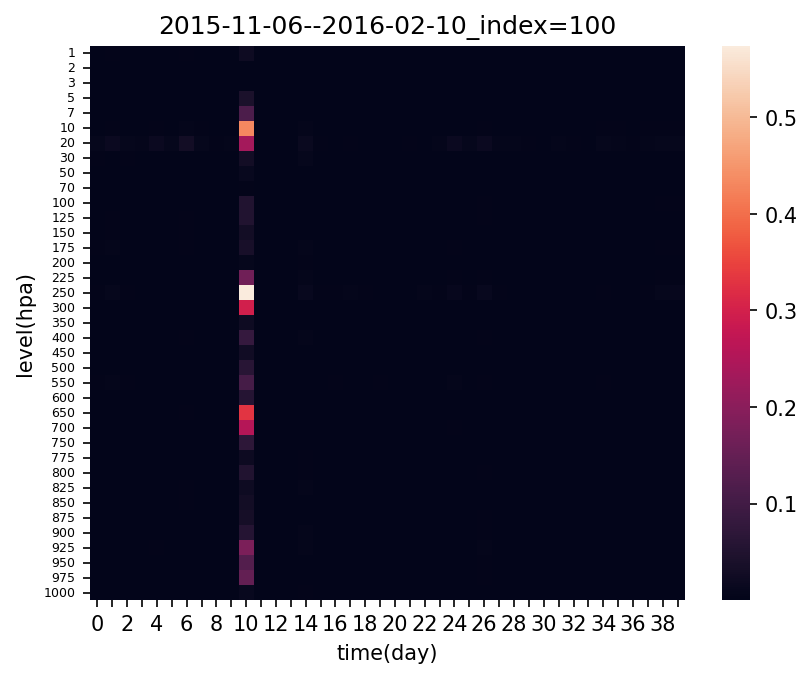

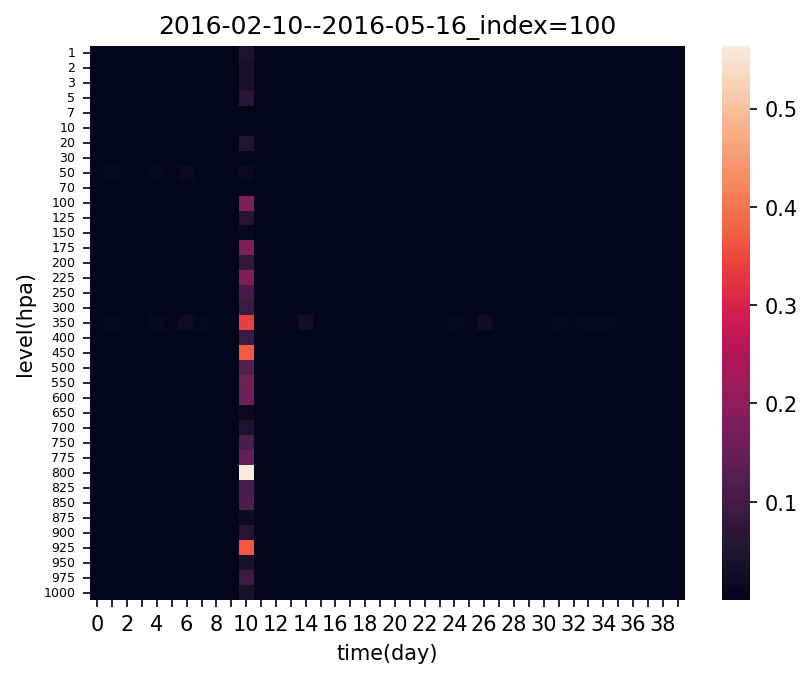

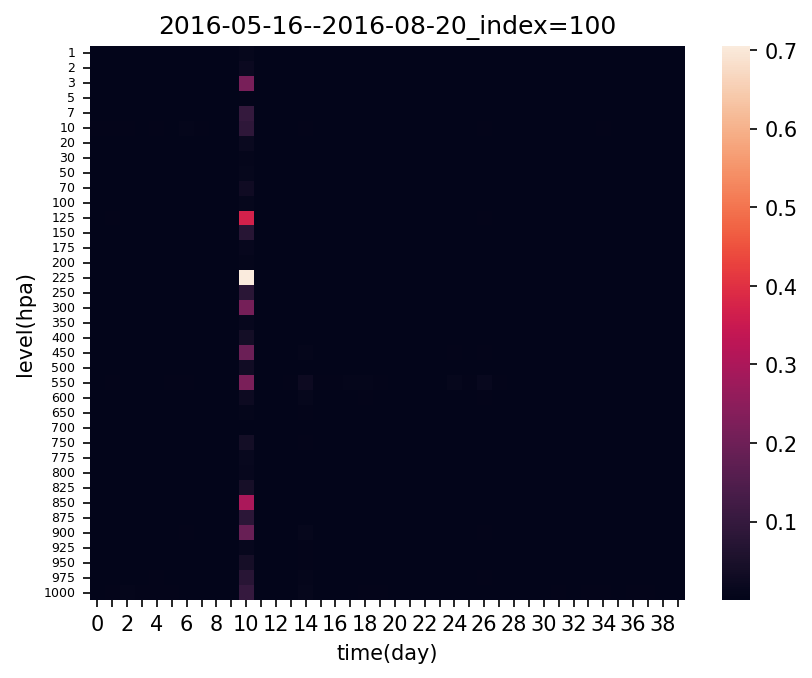

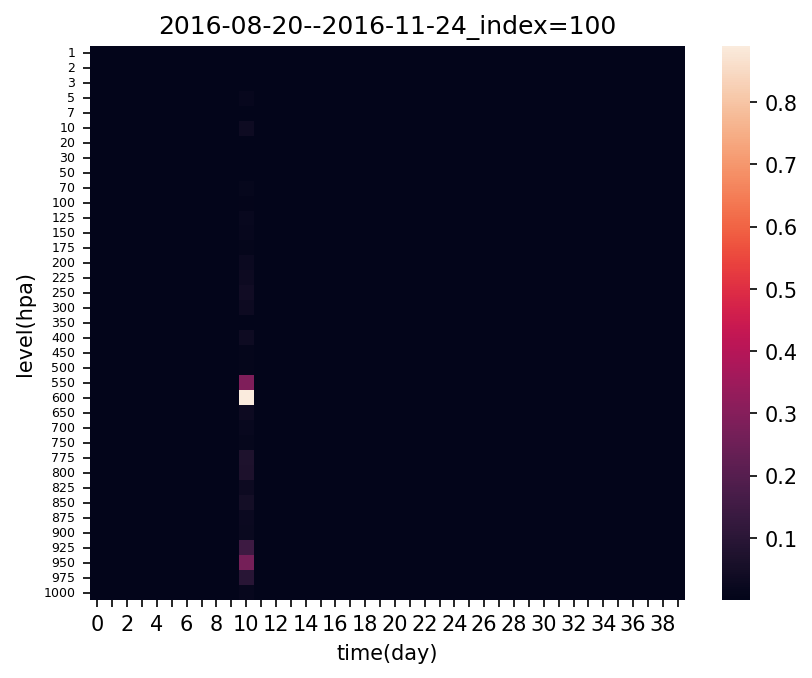

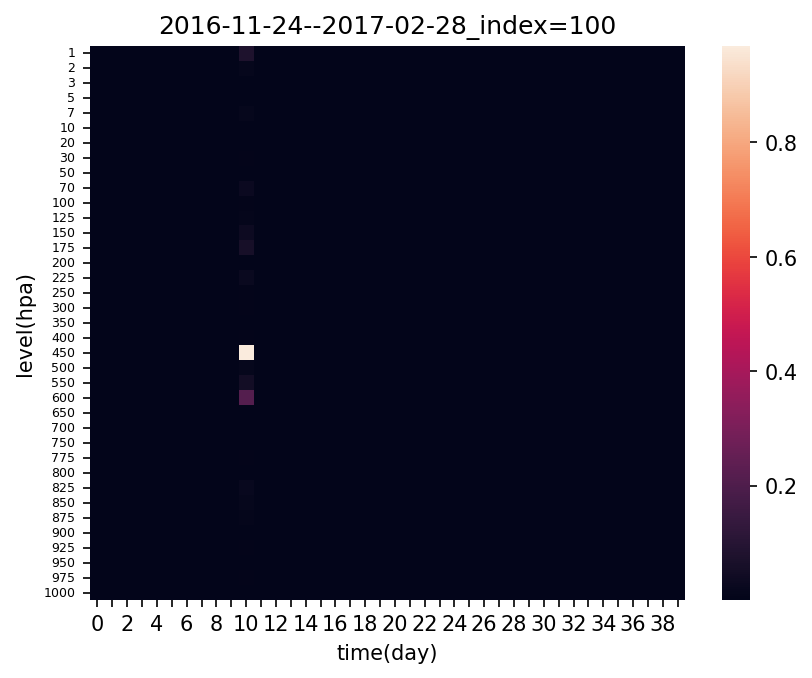

In [28]:
start = 12746
end = 13898
analysis_u(us, seq_len=40, dims=37, start=start, end=end, interval=interval, target=[100])

/home/yuanbing/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


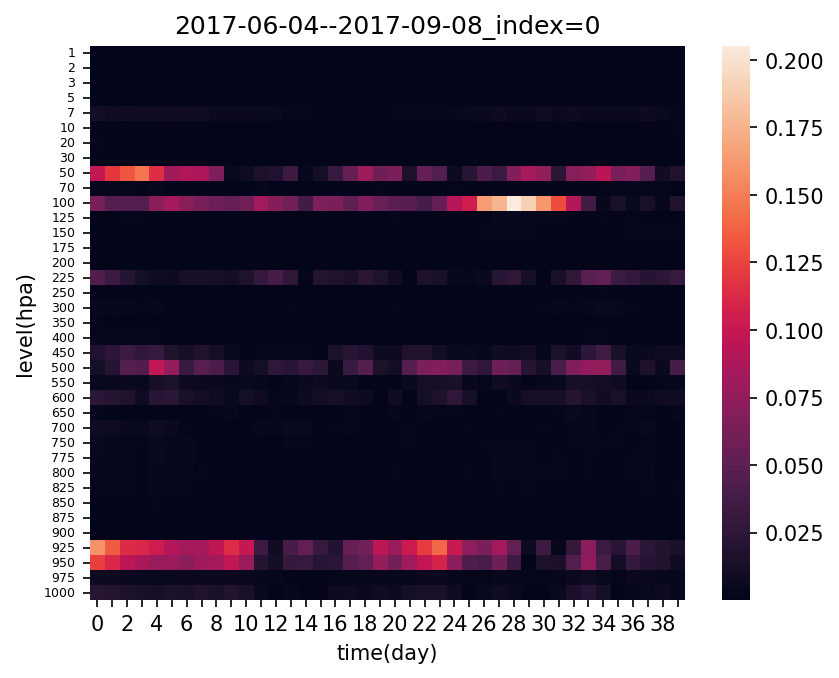

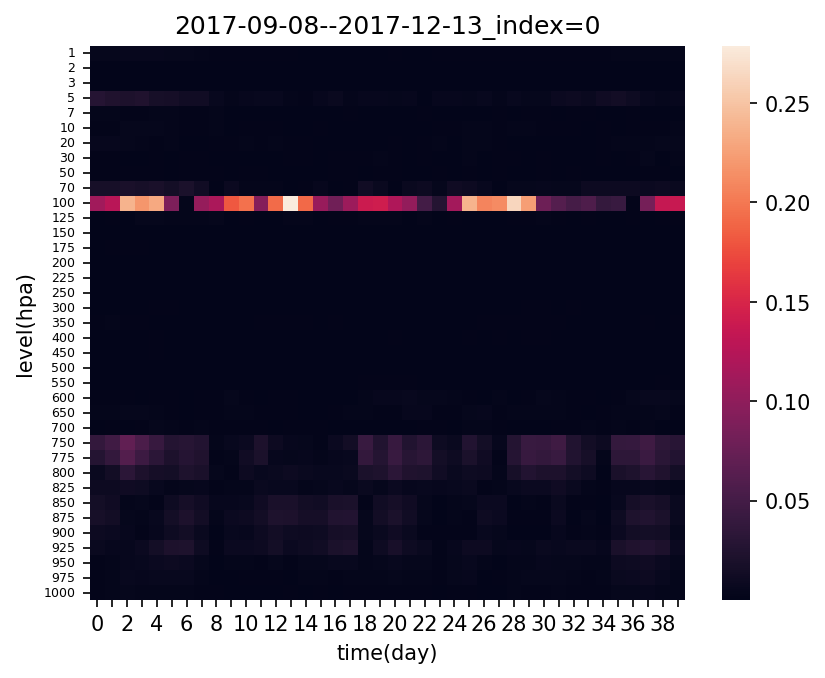

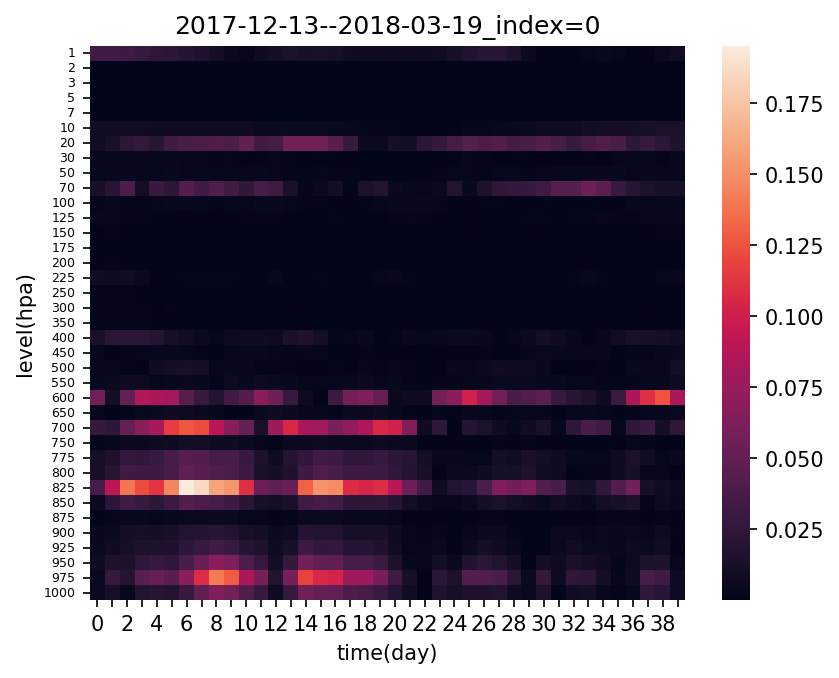

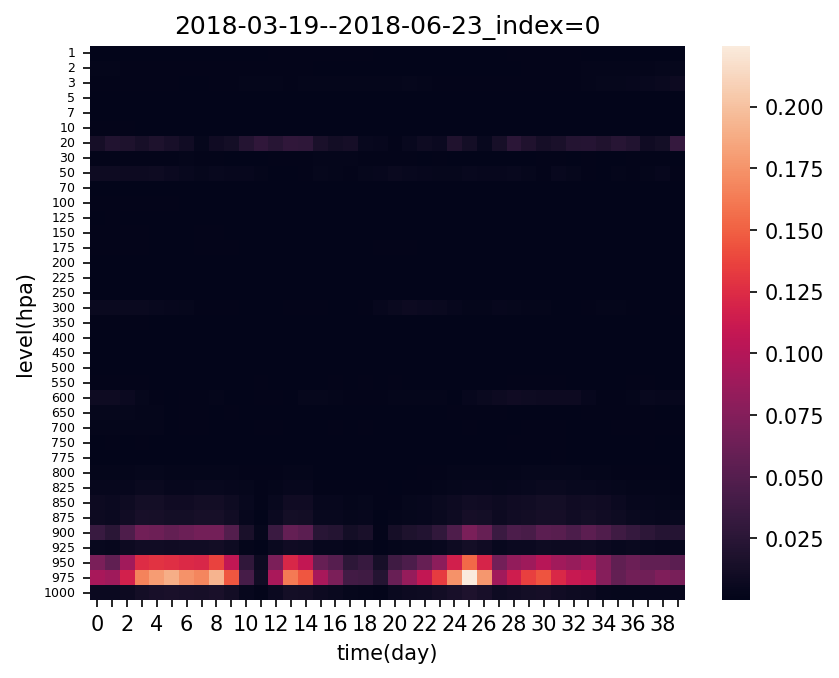

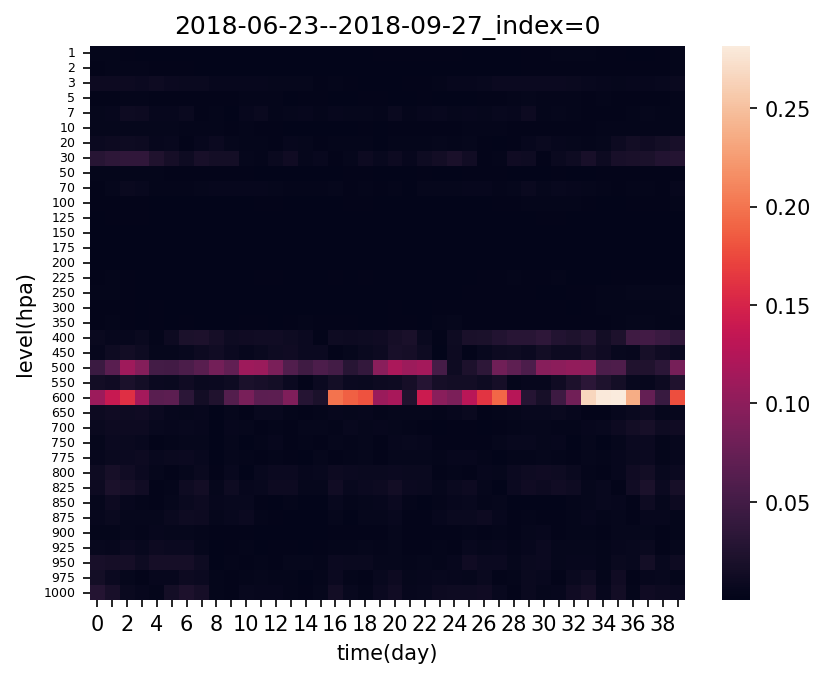

...

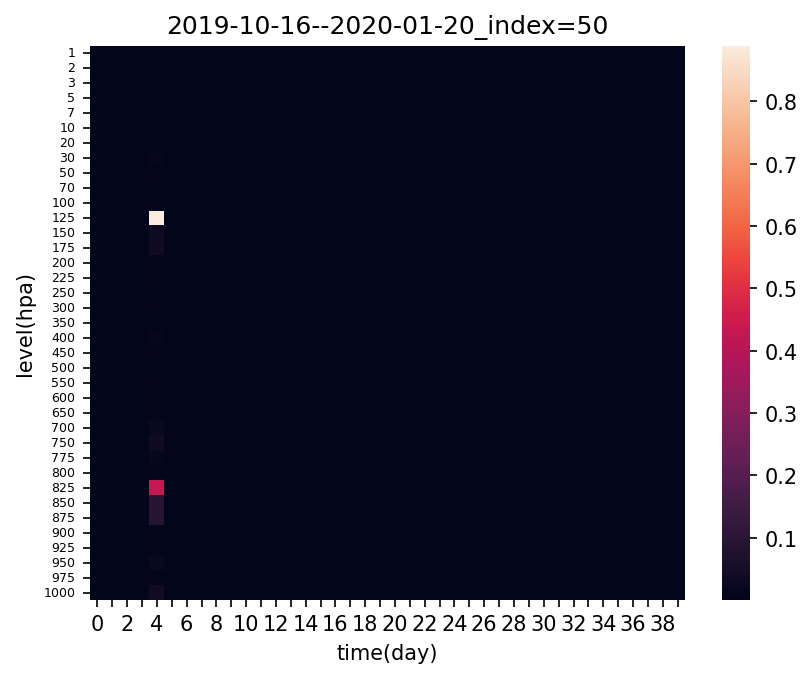

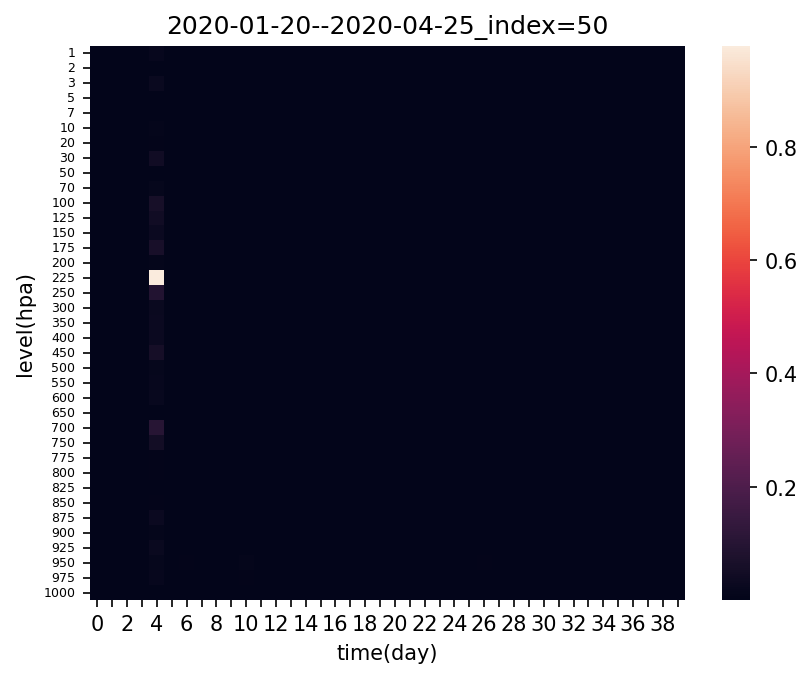

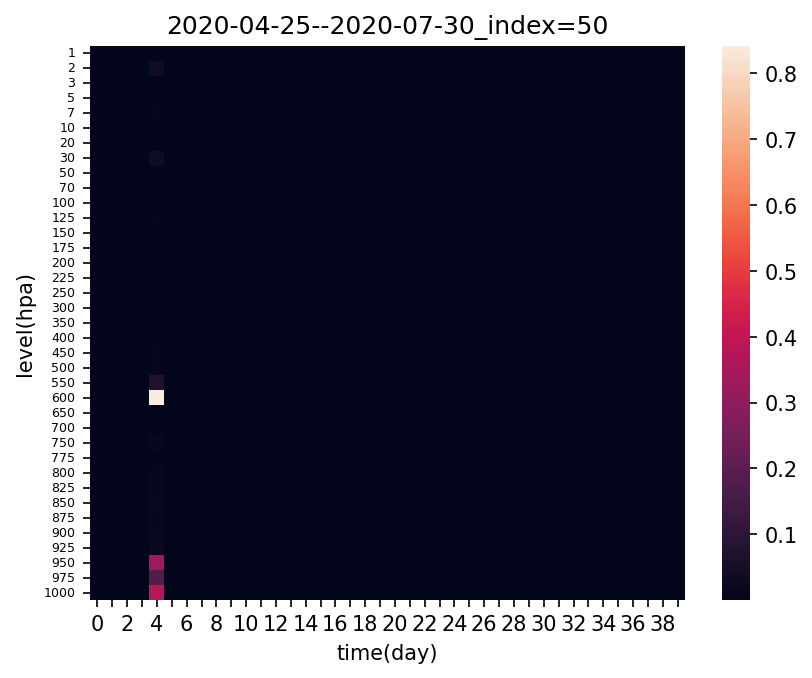

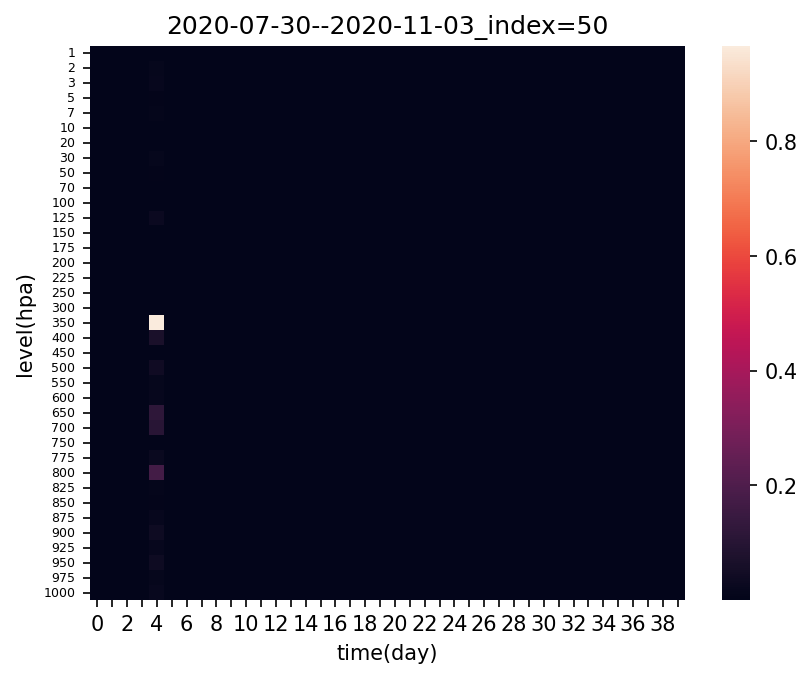

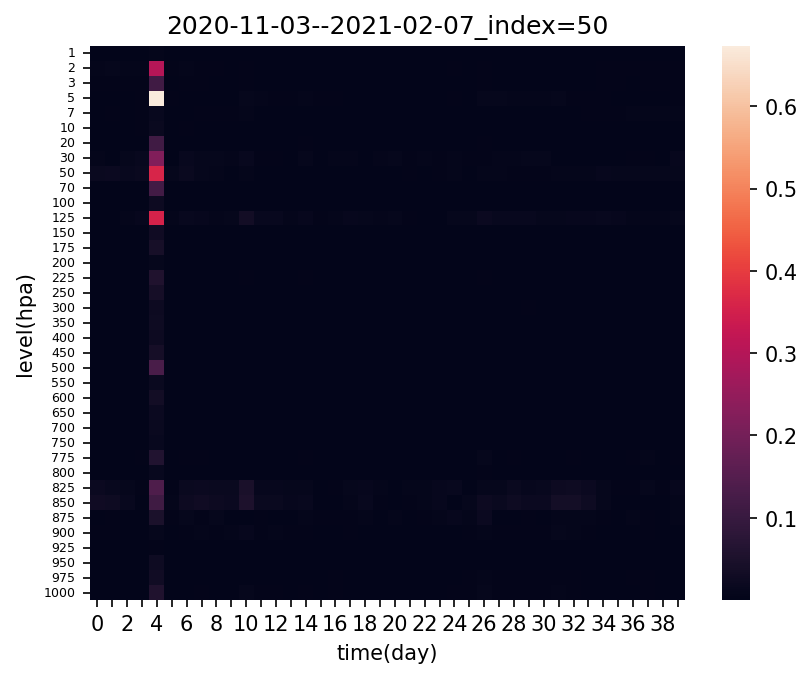

In [26]:
analysis_u(us_1920, seq_len=40, dims=37, start=start, end=end, interval=interval, target=[0,1,50])

# 其他结果

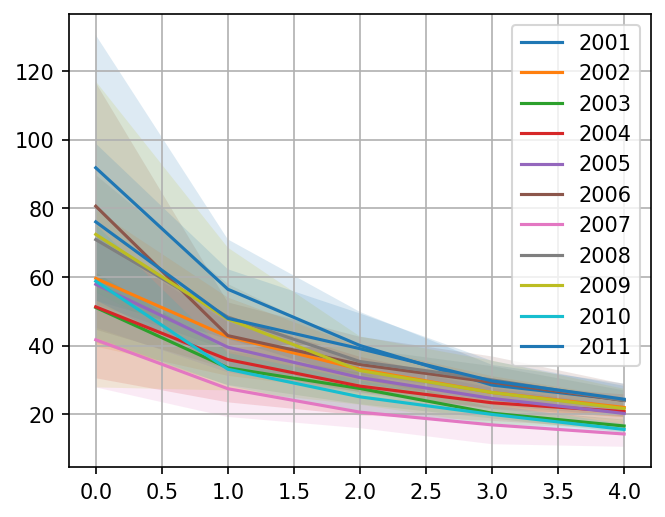

In [67]:
jacs = {i:[] for i in range(720, 852, 12)}
seeds = 10
for expid in range(seeds):
    test_id = "long_term_forecast_data_mean_996_37_iTransformer_QBO_ftM_sl12_pl12_dm512_nh8_el4_dl1_df512_fc3_ebtimeF_dtTrue_Exp_"+str(expid)
    for i in range(720, 852, 12):
        str_i = f'{i:04d}'
        mat = np.load(f'../results/jacobian/{test_id}/jac_{str_i}.npy').reshape(12*36, -1).astype(float)
        u, s, vt = np.linalg.svd(mat)
        jacs[i].append(s) 

plt.figure(figsize=(5,4),dpi=150)
for i in range(720, 852, 12):
    jac_arr = np.array(jacs[i])
    jac_mean = np.mean(jac_arr, axis=0)
    jac_std = np.std(jac_arr, axis=0)
    
    
    plt.plot(jac_mean[:5], label=str(1941+i//12))
    plt.fill_between(range(5), jac_mean[:5]+jac_std[:5], jac_mean[:5]-jac_std[:5], alpha=0.15)
plt.grid()
plt.legend()